# <center> CSM </center>
##  <center> Trabalho Prático 4 </center>



---

In [41]:
# IMPORTS
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import cv2
from time import time
from os import path
import re
import numpy.random as rd
import os
import pandas as pd

---

## Introdução

A codificação de vídeo é um processo essencial para a compressão de dados de vídeo, tornando possível a transmissão eficiente e o armazenamento de vídeos em diversos dispositivos e plataformas. Através da codificação de vídeo, é possível reduzir o tamanho dos arquivos de vídeo, mantendo uma qualidade visual aceitável.  
Neste trabalho, iremos implementar três formas de codificação de vídeo. Cada um desses codificadores terá como objetivo comprimir as sequências de imagens fornecidas, de modo a reduzir seu tamanho sem comprometer muito a qualidade.

### Codificação Intraframe

A codificação intraframe, também conhecida como codificação **I-frame**, é uma técnica de compressão de vídeo em que cada frame é codificada independentemente das frames vizinhas, através da compressão JPEG, sendo responsável pela remoção da redundância espacial.

### Codificação Interframe - Sem Compensação de Movimento

A codificação interframe sem compensação de movimento é uma técnica de compressão de vídeo em que a informação de movimento não é utilizada. Neste método, cada frame é codificada de forma independente, sem considerar as relações de movimento entre elas. Isso resulta numa compressão inferior em comparação com a codificação interframe com compensação de movimento, uma vez que a redundância temporal não é explorada. No entanto, esta abordagem pode ser adequada para cenas com movimento rápido ou aleatório, onde a compensação de movimento não é eficaz.

### Codificação Interframe - Com Compensação de Movimento

A codificação interframe com compensação de movimento é uma técnica que aproveita a redundância temporal entre frames sucessivas para reduzir a quantidade de dados a serem transmitidos ou armazenados. Neste método, as frames são divididas em dois tipos principais: frames de referência (**IFrames** ou **PFrames**) e frames preditas (**BFrames**). As frames de referência são codificadas independentemente, enquanto as frames preditas são codificados com base nas diferenças em relação às frames de referência. A compensação de movimento é utilizada para estimar o deslocamento dos objetos entre frames, permitindo a geração de informações de movimento que são transmitidas ou armazenadas de forma eficiente.

---

### Funções auxiliares

In [42]:
def comp_rate(x,y):
    """
    Taxa de compressão
    @param x: imagem original
    @param y: imagem comprimida
    """
    return os.path.getsize(x)/os.path.getsize(y)

def energy(frame):
    """
    Energia média por pixel
    @param frame: frame
    """
    return np.mean(np.float32(frame)**2)

def entropy(array):
    """
    Entropia
    """
    simb = np.unique(array) #obter símbolos
    prob = np.array([np.sum(array==i) for i in simb])
    
    #prob - array de probabilidades de cada simbolo
    prob = prob/np.sum(prob)

    return -np.dot(prob, np.log2(prob))

def snr(x,y):
    """
    SNR
    """
    # Guardar a potencia do sinal no indice 0 e a potencia do erro no indice 1
    potencia = pot(x,y)
    return 10*np.log10(potencia[0]/potencia[1])

def pot(x,y):
    """
    (Potência do sinal, Potência do erro)
    """
    ps = np.mean(x**2)
    pe = np.mean((x-y)**2)
    
    # Retorna o tuplo (potencia do sinal, potencia do erro)
    return (ps, pe)

In [43]:
def blocos_16x16(array):
    resultado = []
    for i in range(0, array.shape[0], 16):
        linha = []
        for j in range(0, array.shape[1], 16):
            bloco = array[i:i+16, j:j+16]
            linha.append(bloco)
        resultado.append(linha)
    return np.array(resultado)

In [44]:
def remove_blocos16x16(blocos, linhas, colunas):
    imagem = np.zeros((linhas, colunas), dtype=int)
    
    dimensao = imagem.shape
    index = 0
    for i in range(0,dimensao[0],16):
        for j in range(0,dimensao[1],16):
            imagem[i: i + 16, j: j + 16] = blocos[index]
            index += 1

    imagem = np.array(imagem)
    return imagem

In [45]:
# Armazenar frames em listas
framesBola  = []
framesCarro = []

for i in range(11):
    frameBola  = cv2.imread("bola_seq/bola_"  + str(i + 1) + ".tiff", cv2.IMREAD_GRAYSCALE) * 1.0
    frameCarro = cv2.imread("carro_seq/carro_" + str(i + 1) + ".tiff", cv2.IMREAD_GRAYSCALE) * 1.0
    framesBola.append(frameBola)
    framesCarro.append(frameCarro)
    
# Array com os paths para os frames
pathsBola  = []
pathsCarro = []
for i in range(11):
    pathsBola.append("bola_seq/bola_"+str(i+1))
    pathsCarro.append("carro_seq/carro_"+str(i+1))

---

## Exercício 1
Considerar que cada frame é uma intra-frame (I).

Taxa de Compressão para: bola_seq/bola_1 -> 13.261088392576282
Taxa de Compressão para: carro_seq/carro_1 -> 5.434049079754601
SNR Bola: 21.053736444197455
SNR Carro: 30.113487314700834
Entropia Bola: 5.37886197515206
Entropia Carro: 7.04396487847469
Energia Bola: 4129.6543
Energia Carro: 21932.773


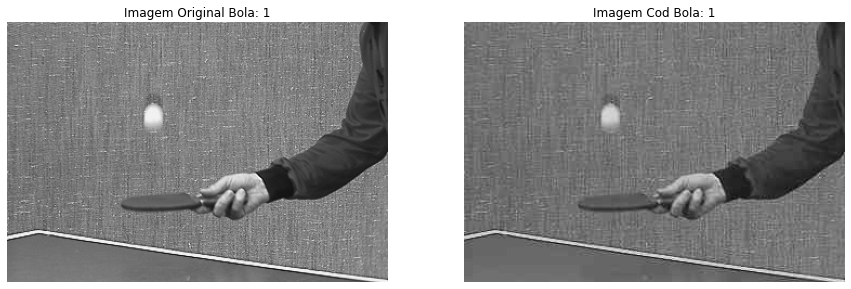

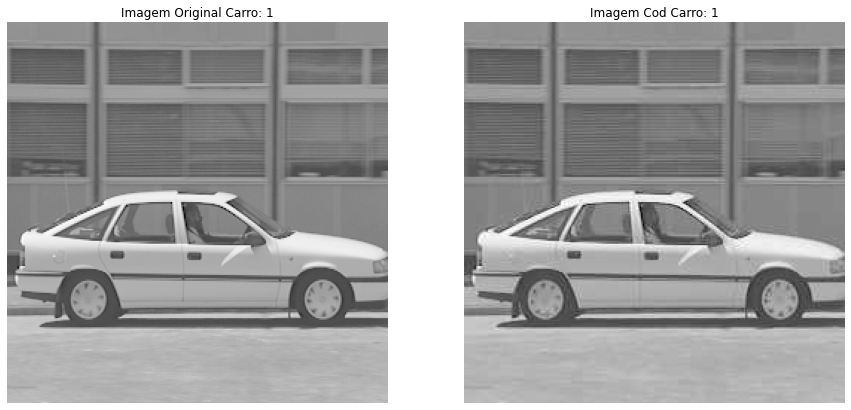

Taxa de Compressão para: bola_seq/bola_2 -> 13.244151358140995
Taxa de Compressão para: carro_seq/carro_2 -> 5.403939393939394
SNR Bola: 21.02563535884888
SNR Carro: 29.985775240162337
Entropia Bola: 5.373953842775923
Entropia Carro: 7.040935836199967
Energia Bola: 4136.605
Energia Carro: 22169.51


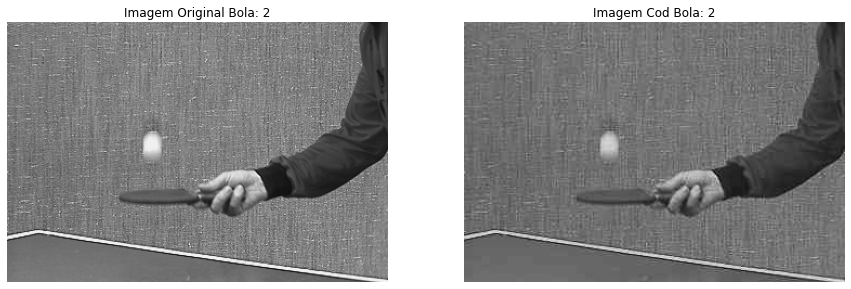

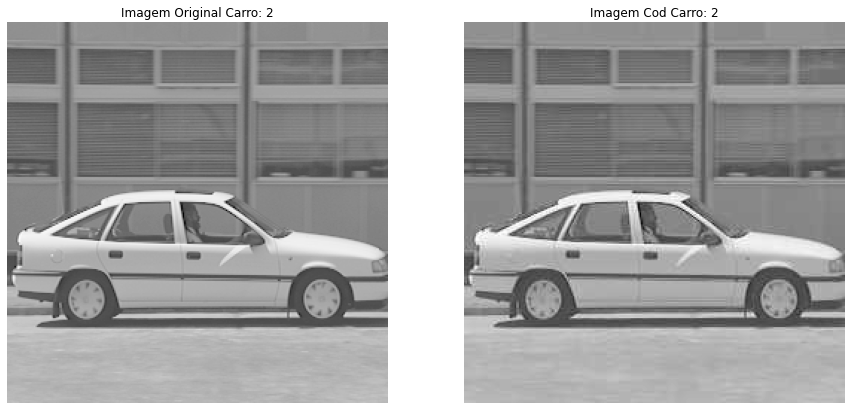

Taxa de Compressão para: bola_seq/bola_3 -> 13.179928091292794
Taxa de Compressão para: carro_seq/carro_3 -> 5.403723008190618
SNR Bola: 20.93604152766289
SNR Carro: 30.046381450799494
Entropia Bola: 5.365737801608912
Entropia Carro: 7.061691841597094
Energia Bola: 4132.742
Energia Carro: 22368.5


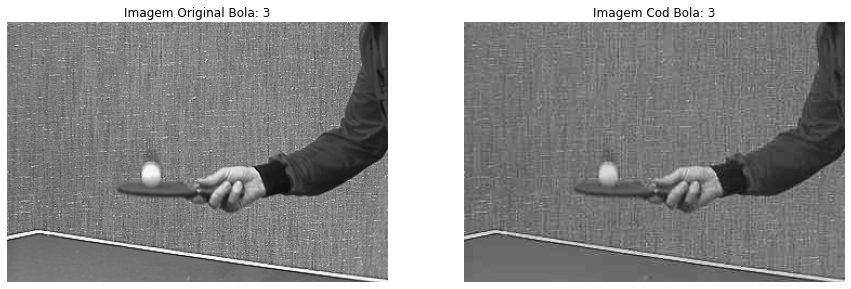

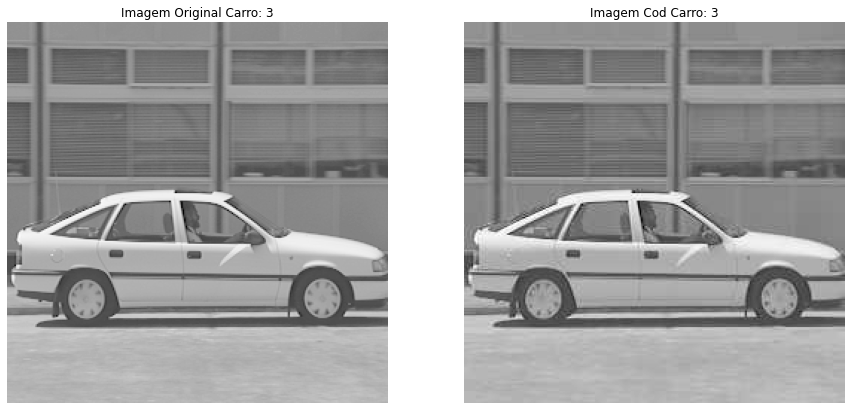

Taxa de Compressão para: bola_seq/bola_4 -> 13.222135130898259
Taxa de Compressão para: carro_seq/carro_4 -> 5.5220871627631185
SNR Bola: 20.907813656928194
SNR Carro: 30.113441472797142
Entropia Bola: 5.354244450715912
Entropia Carro: 7.068322745988879
Energia Bola: 4134.094
Energia Carro: 22621.396


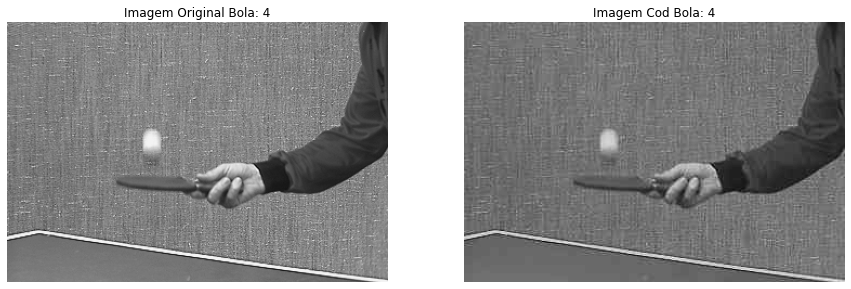

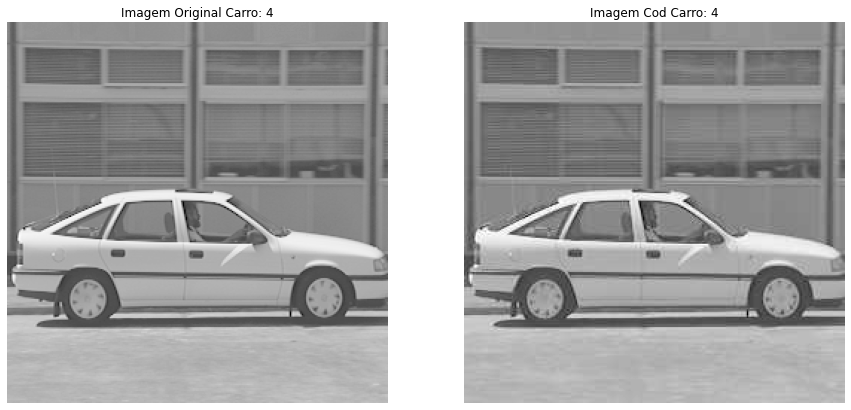

Taxa de Compressão para: bola_seq/bola_5 -> 13.225604016316286
Taxa de Compressão para: carro_seq/carro_5 -> 5.375792422232051
SNR Bola: 20.95529684919218
SNR Carro: 30.105212637677937
Entropia Bola: 5.350419974103617
Entropia Carro: 7.065285334729067
Energia Bola: 4139.627
Energia Carro: 22999.164


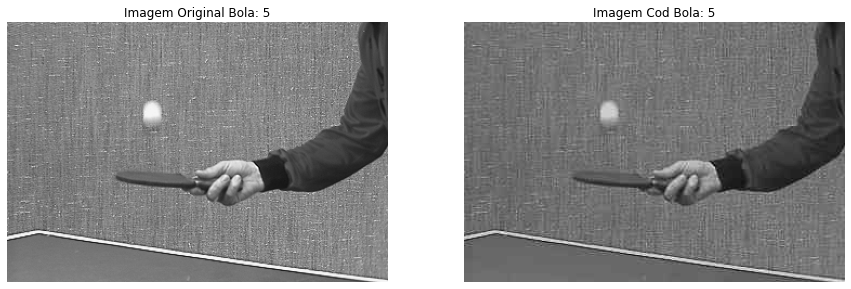

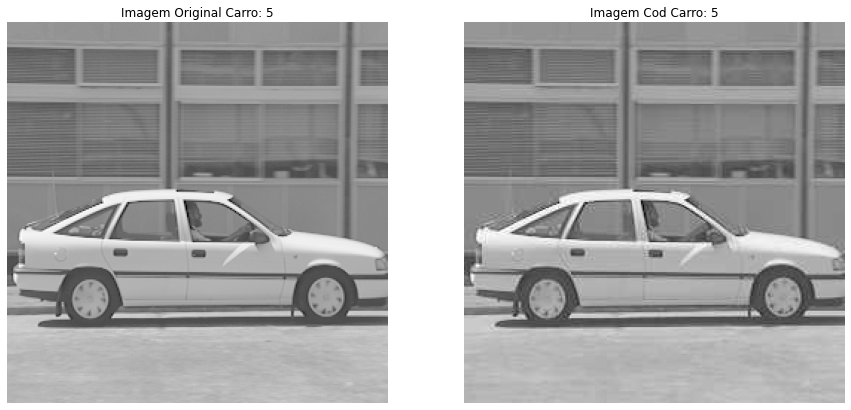

Taxa de Compressão para: bola_seq/bola_6 -> 13.180209801158604
Taxa de Compressão para: carro_seq/carro_6 -> 5.429416987274341
SNR Bola: 21.000125831164652
SNR Carro: 30.130641482622828
Entropia Bola: 5.3513876865575245
Entropia Carro: 7.074262209035987
Energia Bola: 4138.2324
Energia Carro: 23252.555


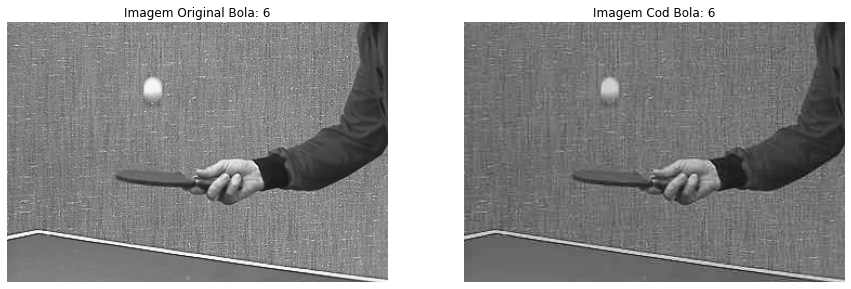

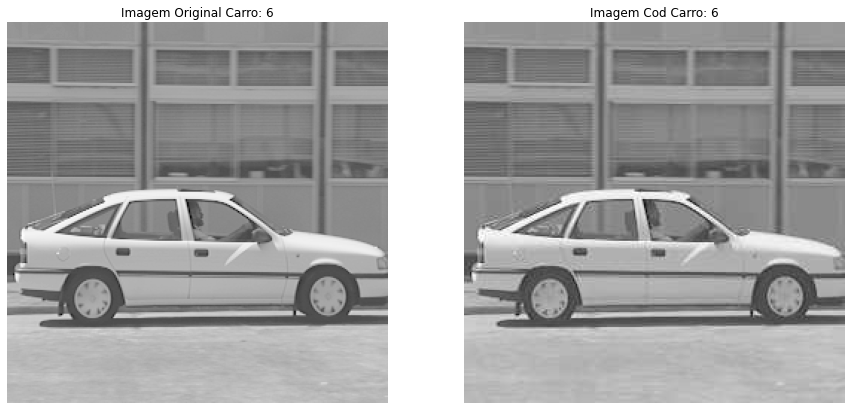

Taxa de Compressão para: bola_seq/bola_7 -> 13.189544529660354
Taxa de Compressão para: carro_seq/carro_7 -> 5.3786093105480255
SNR Bola: 20.98015708240911
SNR Carro: 30.252702796492514
Entropia Bola: 5.357267005380396
Entropia Carro: 7.07667917910885
Energia Bola: 4129.844
Energia Carro: 23546.963


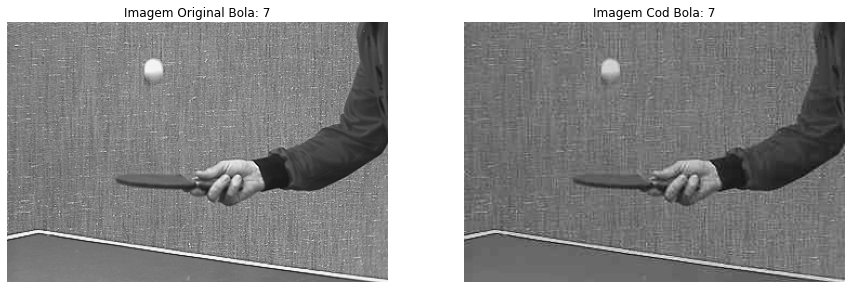

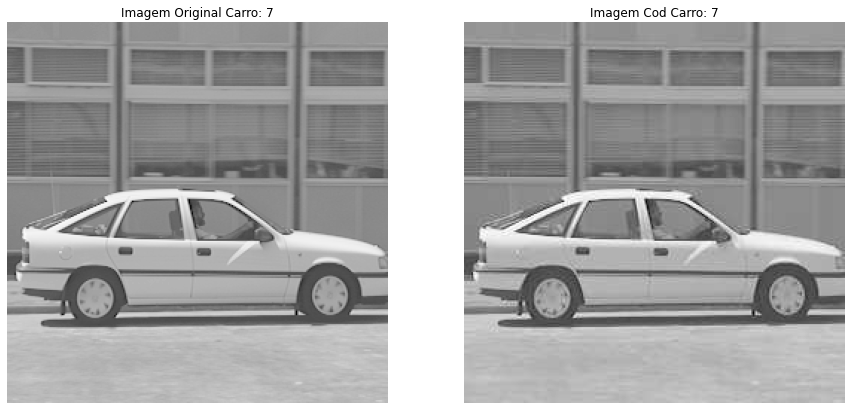

Taxa de Compressão para: bola_seq/bola_8 -> 13.160756131854399
Taxa de Compressão para: carro_seq/carro_8 -> 5.3885688967656185
SNR Bola: 20.922054209026648
SNR Carro: 30.309492242559976
Entropia Bola: 5.369776165200459
Entropia Carro: 7.072904304939351
Energia Bola: 4128.5527
Energia Carro: 23710.396


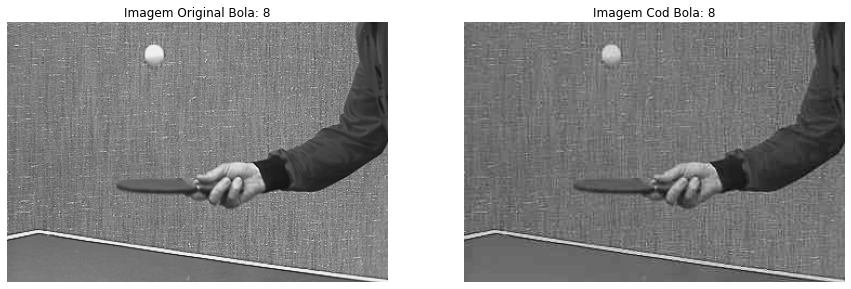

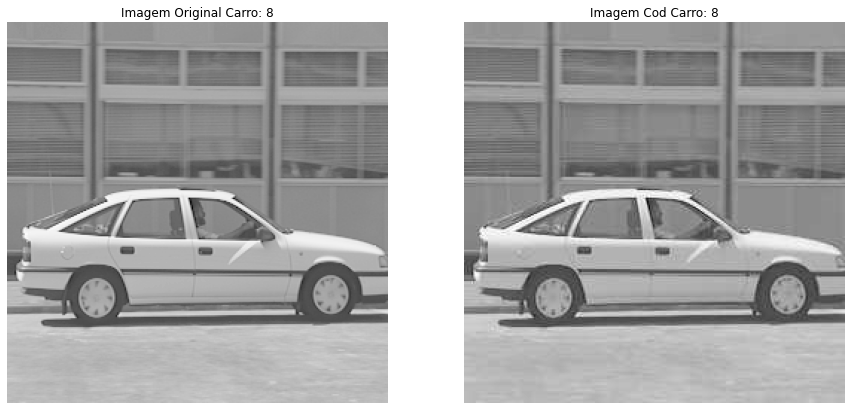

Taxa de Compressão para: bola_seq/bola_9 -> 13.098027031225726
Taxa de Compressão para: carro_seq/carro_9 -> 5.4153297682709445
SNR Bola: 20.910217222249123
SNR Carro: 30.259055238438854
Entropia Bola: 5.3820096889601565
Entropia Carro: 7.0696553623989065
Energia Bola: 4122.126
Energia Carro: 23766.977


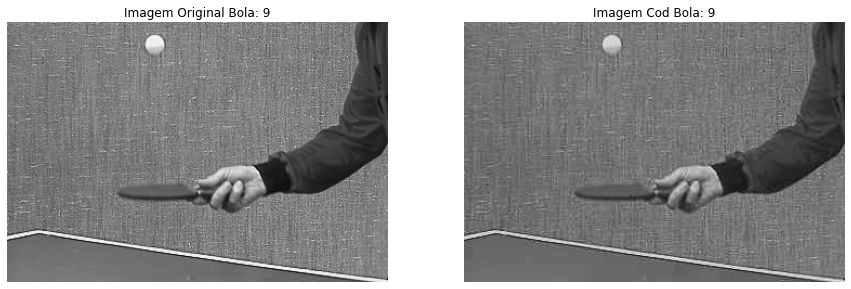

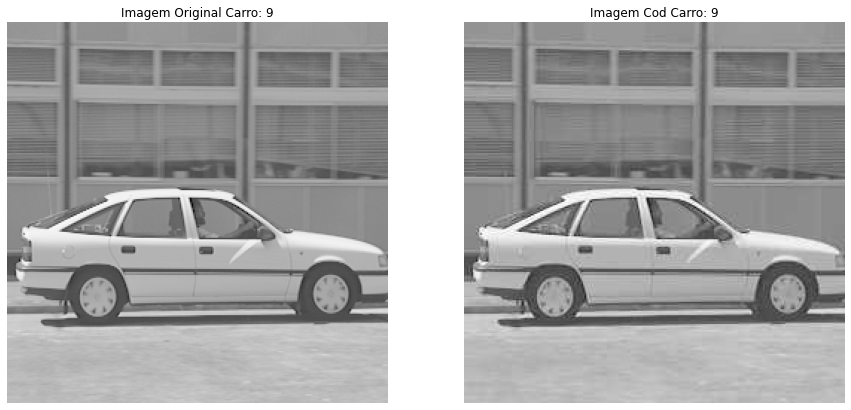

Taxa de Compressão para: bola_seq/bola_10 -> 13.057510463494031
Taxa de Compressão para: carro_seq/carro_10 -> 5.484704484704484
SNR Bola: 20.894206565002538
SNR Carro: 30.226399876060892
Entropia Bola: 5.3921033873549264
Entropia Carro: 7.0739024548410665
Energia Bola: 4117.94
Energia Carro: 23855.816


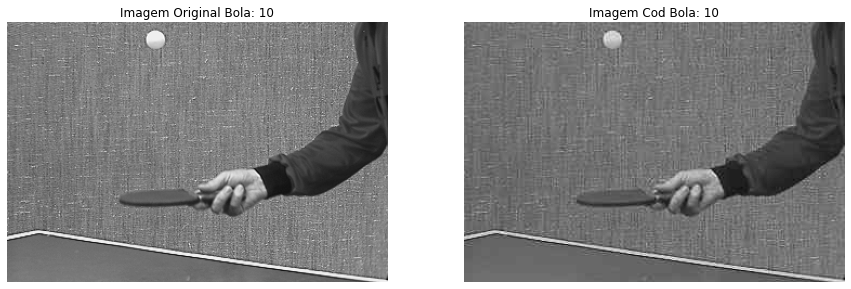

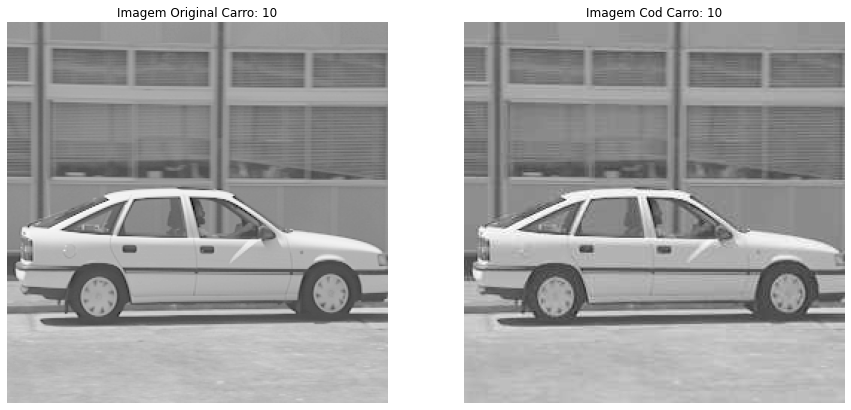

Taxa de Compressão para: bola_seq/bola_11 -> 13.066128531511954
Taxa de Compressão para: carro_seq/carro_11 -> 5.46941740520122
SNR Bola: 20.90923363160664
SNR Carro: 30.246558277265482
Entropia Bola: 5.398022736244526
Entropia Carro: 7.098597311848149
Energia Bola: 4116.0347
Energia Carro: 23946.38


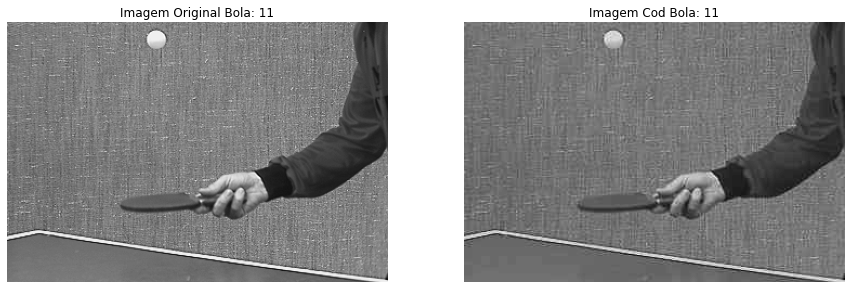

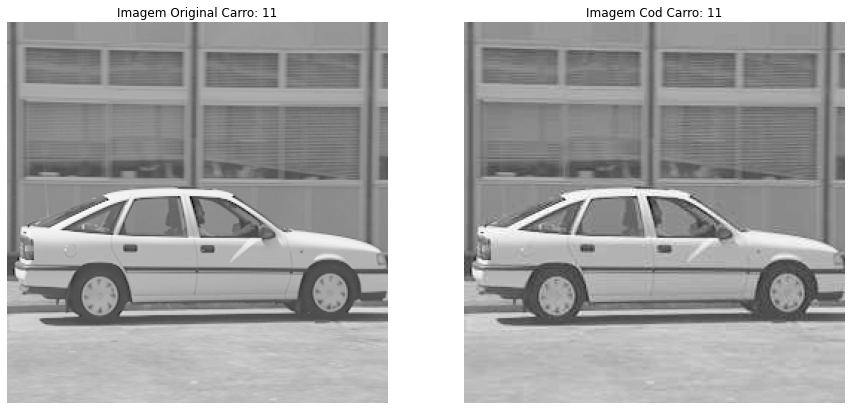

In [46]:
# Arrays destinados a armazenar os valores para a análise dos resultados
taxasCompBola   = []
taxasCompCarro  = []
snrsBola        = []
snrsCarro       = []
entropsBola     = []
entropsCarro    = []
energyBola      = []
energyCarro     = []
timeCompBola    = []
timeDecompBola  = []
timeCompCarro   = []
timeDecompCarro = []

# Usando algoritmo JPEG do OpenCV com uma qualidade de 50%

for i in range(len(framesBola)):
        frameBola    = framesBola[i]
        frameCarro   = framesCarro[i]
        #pathBolaCod  = "bola_seq_cod/bola_"   + str(i + 1)
        #pathCarroCod = "carro_seq_cod/carro_" + str(i + 1)
        pathBola     = "bola_seq/bola_"   + str(i + 1)
        pathCarro    = "carro_seq/carro_" + str(i + 1)
        
        # CODIFICAÇÃO
        t0 = time()
        cv2.imwrite(pathBola + '_cod1.jpg', frameBola.astype('uint8'), (cv2.IMWRITE_JPEG_QUALITY,50)) # BOLA
        t1 = time()
        cv2.imwrite(pathCarro + '_cod1.jpg', frameCarro.astype('uint8'), (cv2.IMWRITE_JPEG_QUALITY,50)) # CARRO
        t2 = time()
        timeCompBola.append(t1 - t0)
        timeCompCarro.append(t2 - t1)
        
        # DESCODIFICAÇÃO
        frameBolaDecod = cv2.imread(pathBola + '_cod1.jpg', cv2.IMREAD_GRAYSCALE) # BOLA
        t3 = time()
        frameCarroDecod = cv2.imread(pathCarro + '_cod1.jpg', cv2.IMREAD_GRAYSCALE) # CARRO
        t4 = time()
        timeDecompBola.append(t3 - t2)
        timeDecompCarro.append(t4 - t3)

        # TAXA DE COMPRESSÃO
        taxasCompBola.append(comp_rate(pathBola + '.tiff', pathBola + '_cod1.jpg'))
        taxasCompCarro.append(comp_rate(pathCarro + '.tiff', pathCarro + '_cod1.jpg'))
        print("Taxa de Compressão para:", pathBola, "->", taxasCompBola[i])
        print("Taxa de Compressão para:", pathCarro, "->", taxasCompCarro[i])

        # SNR
        snrsBola.append(snr(frameBola, frameBolaDecod))
        snrsCarro.append(snr(frameCarro, frameCarroDecod))
        print("SNR Bola:", snrsBola[i])
        print("SNR Carro:", snrsCarro[i])
        
        # ENTROPIA
        entropsBola.append(entropy(frameBolaDecod))
        entropsCarro.append(entropy(frameCarroDecod))
        print("Entropia Bola:", entropsBola[i])
        print("Entropia Carro:", entropsCarro[i])

        # ENERGIA
        energyBola.append(energy(frameBolaDecod))
        energyCarro.append(energy(frameCarroDecod))
        print("Energia Bola:", energyBola[i])
        print("Energia Carro:", energyCarro[i])

        # BOLA
        plt.figure(figsize=(15,15))
        plt.subplot(1,2,1) 
        plt.axis("off")
        plt.title("Imagem Original Bola: " + str(i+1))
        plt.imshow(frameBola)
        plt.gray()
        
        plt.subplot(1,2,2) 
        plt.axis("off")
        plt.title("Imagem Cod Bola: " + str(i+1))
        plt.imshow(frameBolaDecod)
        plt.gray()
        plt.show()
        
        # CARRO
        plt.figure(figsize=(15,15))
        plt.subplot(1,2,1) 
        plt.axis("off")
        plt.title("Imagem Original Carro: " + str(i+1))
        plt.imshow(frameCarro)
        plt.gray()
        
        plt.subplot(1,2,2) 
        plt.axis("off")
        plt.title("Imagem Cod Carro: " + str(i+1))
        plt.imshow(frameCarroDecod)
        plt.gray()
        plt.show()

### Taxa de Compressão

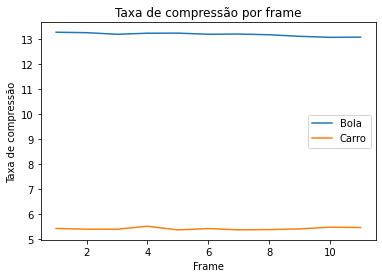

In [47]:
frames = range(1, len(taxasCompBola) + 1)

plt.plot(frames, taxasCompBola, label='Bola')
plt.plot(frames, taxasCompCarro, label='Carro')
plt.xlabel('Frame')
plt.ylabel('Taxa de compressão')
plt.title('Taxa de compressão por frame')
plt.legend()
plt.show()

### SNR

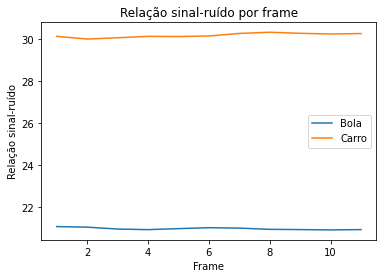

In [48]:
plt.plot(frames, snrsBola, label='Bola')
plt.plot(frames, snrsCarro, label='Carro')
plt.xlabel('Frame')
plt.ylabel('Relação sinal-ruído')
plt.title('Relação sinal-ruído por frame')
plt.legend()
plt.show()

### Entropia

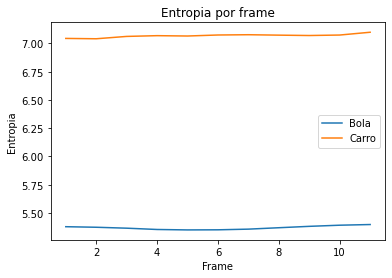

In [49]:
plt.plot(frames, entropsBola, label='Bola')
plt.plot(frames, entropsCarro, label='Carro')
plt.xlabel('Frame')
plt.ylabel('Entropia')
plt.title('Entropia por frame')
plt.legend()
plt.show()

### Energia Média por Pixel

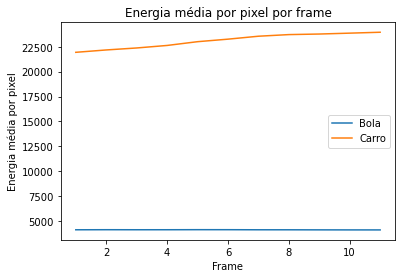

In [50]:
plt.plot(frames, energyBola, label='Bola')
plt.plot(frames, energyCarro, label='Carro')
plt.xlabel('Frame')
plt.ylabel('Energia média por pixel')
plt.title('Energia média por pixel por frame')
plt.legend()
plt.show()

### Tempo de Compressão e Descompressão

In [51]:
data = {'Frame': frames, 'Tempo de compressão (Bola)': timeCompBola, 'Tempo de compressão (Carro)': timeCompCarro,'Tempo de descompressão (Bola)': timeDecompBola, 'Tempo de descompressão (Carro)': timeDecompCarro}
df = pd.DataFrame(data)
df

,Frame,Tempo de compressão (Bola),Tempo de compressão (Carro),Tempo de descompressão (Bola),Tempo de descompressão (Carro)
0,1,0.005574,0.003385,0.003065,0.003027
1,2,0.004306,0.001032,0.006876,0.002069
2,3,0.005106,0.001994,0.001025,0.001537
3,4,0.004487,0.002571,0.002992,0.001599
4,5,0.008192,0.002816,0.010170,0.002335
5,6,0.004326,0.003207,0.010404,0.001002
6,7,0.004398,0.001510,0.002479,0.000504
7,8,0.004407,0.003519,0.002843,0.003092
8,9,0.012822,0.005401,0.004597,0.003419
9,10,0.004869,0.003018,0.010223,0.005549


### Taxa de compressão

In [52]:
data = {'Frame': frames, 'Taxa de compressão (Bola)': taxasCompBola, 'Taxa de compressão (Carro)': taxasCompCarro}
df = pd.DataFrame(data)
df

,Frame,Taxa de compressão (Bola),Taxa de compressão (Carro)
0,1,13.261088,5.434049
1,2,13.244151,5.403939
2,3,13.179928,5.403723
3,4,13.222135,5.522087
4,5,13.225604,5.375792
5,6,13.180210,5.429417
6,7,13.189545,5.378609
7,8,13.160756,5.388569
8,9,13.098027,5.415330
9,10,13.057510,5.484704


## Análise dos Valores
Este descodificador aplica a técnica de <b>Codificação Intraframe</b> (Cada frame é considerada uma intra-frame) que aplica uma codificação espacial em frames de vídeo e aplica a codificaçao JPEG em cada frame.
<br>
Para cada sequência de imagens foram calculadas várias métricas como a taxa de compressão, a relação sinal-ruído (SNR), a entropia, energia e tempos de codificação e descodificação. Estes valores foram apresentados em tabelas para uma análise mais aprofundada do descodificador.

## Taxa de Compressão
   Neste algoritmo foi aplicada uma compressão JPEG com um fator de qualidade 50% em cada frame. Isto resultou numa taxa de compressão de aproximadamente 13.1 para a sequência de frames da bola (bola_seq) e 5 para a sequência de frames do carro (carro_seq). <br>
   
   Apesar de se verificar uma baixa taxa de compressão, houve algumas perdas e os resultados não foram os mais eficientes, pois apenas foi aplicada uma compressão espacial, sem considerar a compressão temporal. Na compressão espacial, apenas as informações necessárias são preservadas, descartando as redundâncias e não são consideradas as frames anteriores. 
  
  Portanto, a compressão não atinge resultados tão significativos em termos de redução do tamanho do ficheiro, resultando em uma taxa de compressão relativamente baixa.

## Relação Sinal-Ruído (SNR)
Como já tinhamos mencionado no trabalho anterior, esta relação está diretamente relacionada com a perda de informação causada pela compressão JPEG. Quanto menor o fator de qualidade, maior a perda de informação e, consequentemente, maior o valor do SNR. 

Nesta codificação, apenas o ruído proveniente da compressão JPEG é considerado, utilizando um fator de qualidade de 50% em todas as imagens. Esta aplicação resultou em valores de SNR de cerca de 21 dB para a sequência de bolas e 30 dB para a sequência de carros.

## Entropia
Esta grandeza mede a quantidade de informação presente numa frame. Neste algoritmo, a compressão de todas as imagens como um todo é levada em consideração, resultando em uma maior quantidade de informação por frame e daí obtém um valor de entropia mais alto. 

Para a sequência de frames de bolas, podemos observar que não há uma grande variação nos tons de cinza da imagem, resultando em um valor de entropia de cerca de 5.3 enquanto na sequência de frames de carros, os tons de cinzentos variam mais e acabam por obter um valor de entropia superior de aproximadamente 7.

## Energia Média Por Píxel
A energia média por pixel representa a intensidade média dos valores de pixel numa frame de vídeo e é calculada através da média dos valores dos pixels ao quadrado. 

Um vídeo com mais movimento tende a ter uma maior energia média por pixel. Isto acontece porque o movimento num vídeo é geralmente acompanhado por mudanças rápidas nos valores de pixel entre frames consecutivas. 

Neste exercício obteve-se valores de cerca de 4100 para a seq. da bola e 23000 para a seq. do carro. Isto justifica-se pois há muito mais movimento na seq. de frames do carro do que na seq. de frames da bola.

---

## Exercício 2
Considerar que todas as frames à exceção da primeira (a I-frame) são inter-frames (P). Neste codificador deve
criar as P-frames, que são a diferença entre a frame a codificar e a I-frame, sem compensação de movimento.
Visualize a P-frame (ou seja a imagem a transmitir).

In [53]:
def codif_ex2(i_frame,frame_atual,path):
    #Calcular a diferença entre os valores dos pixeis da frame atual e da frame de referencia
    #De seguida adicionar 255 para garantir que o valor esteja entr [0,255]
    #Divide-se por dois para reduzir a escala dos valores 
    p_frame = ((frame_atual-i_frame)+255)/2
    #Salvar a nova imagem em num ficheiro JPEG com qualidade de compressão = 50%
    cv2.imwrite(path+'cod_ex2.jpg',p_frame.astype('uint8'),(cv2.IMWRITE_JPEG_QUALITY,50))

In [54]:
def decodif_ex2(i_frame,path):
    #Buscar a imagem codificada na função anterior
    p_frame_r = cv2.imread(path+'cod_ex2.jpg',cv2.IMREAD_GRAYSCALE)
    #Processamento de descodificação da imagem codificada
    p_frame   = (p_frame_r*2.0)-255
    frame     = p_frame+i_frame
    #Garantir que os valores dos pixeis estejamm no intervalo de [0,255]
    frame     = np.clip(frame,0,255)
    #return da frame processada e da frame descodificada
    return p_frame,frame

In [55]:
def resultados_ex2(seq_imgs,seq_path):

    taxa_comp    = []  # Array das taxas de compressão
    snr_array    = []  # Array das taxas de SNR
    entropia      = [] # Array dos valores de entropia
    energia       = [] # Array dos valores de energia
    time_codif   = []  # Array dos tempos de codificação
    time_decodif = []  # Array dos tempos de descodificação

    #A primeira frame não é aplicada no codificador 2 logo usa-se a o método da primeira codificação realizada neste trabalho
    i_frame = cv2.imread(seq_path[0] + '_cod1.jpg', cv2.IMREAD_GRAYSCALE)

    for i in range(len(seq_imgs)-1):
        frame = seq_imgs[i+1]
        # print('frame->',frame)
        path = seq_path[i+1]

        # Parte de codificação
        t0 = time()
        codif_ex2(i_frame,frame,path)
        t1 = time()
        time_codif.append(t1-t0)

        # Parte de descodificação
        p_frame, imagem = decodif_ex2(i_frame,path)
        t2 = time()
        time_decodif.append(t2-t1)

        # Cálculo da taxa de compressão
        taxa_comp.append(comp_rate(path+'.tiff',path+'cod_ex2.jpg'))
        print('Taxa de compressão:', taxa_comp[i])

        # Cálculo do SNR
        snr_array.append(snr(frame,imagem))
        print('SNR:', snr_array[i])

        # Cálculo da entropia
        entropia.append(entropy(p_frame))
        print("Entropia: " , entropia[i])

        # Cálculo da energia
        energia.append(energy(p_frame))
        print('Energia: ',energia[i])

        plt.figure(figsize=(15,15))
        plt.subplot(1,2,1)
        plt.axis('off')
        plt.title('Imagem cod ' + path[5:9] + ' ' + str(i+2))
        plt.imshow(p_frame)

        plt.subplot(1,2,2)
        plt.axis('off')
        plt.title("Imagem descod " + path[5:9] + ' ' + str(i+2))
        plt.imshow(imagem)
        plt.gray()
        plt.show()
        
    return taxa_comp,snr_array,entropia,energia,time_codif,time_decodif

Taxa de compressão: 42.62354724608388
SNR: 20.47336078878564
Entropia:  1.7248372786471977
Energia:  48.700474


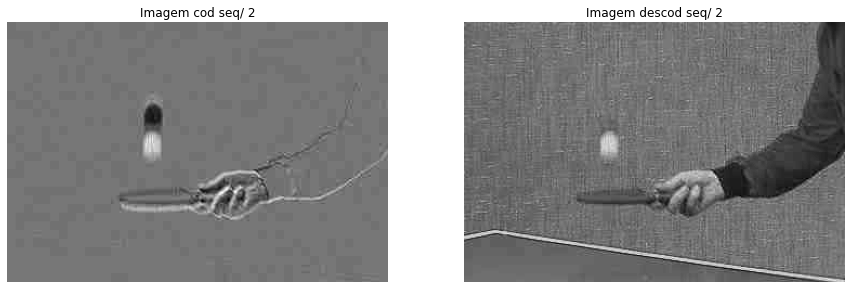

Taxa de compressão: 39.92045454545455
SNR: 20.387026171766905
Entropia:  1.9255631390465018
Energia:  70.413734


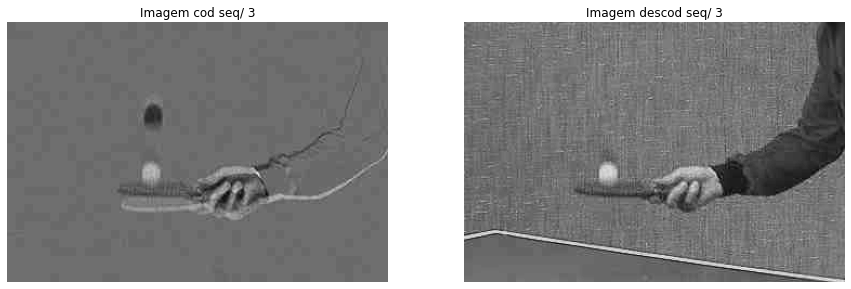

Taxa de compressão: 36.91203501094092
SNR: 20.11156568356574
Entropia:  2.2711257567882965
Energia:  80.99953


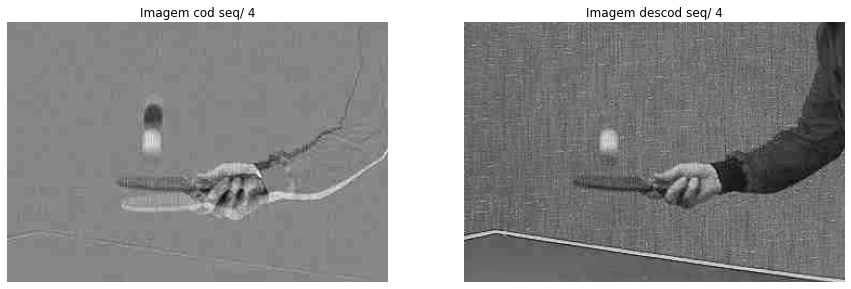

Taxa de compressão: 36.195792185487335
SNR: 20.16756488804305
Entropia:  2.286780592017519
Energia:  79.19261


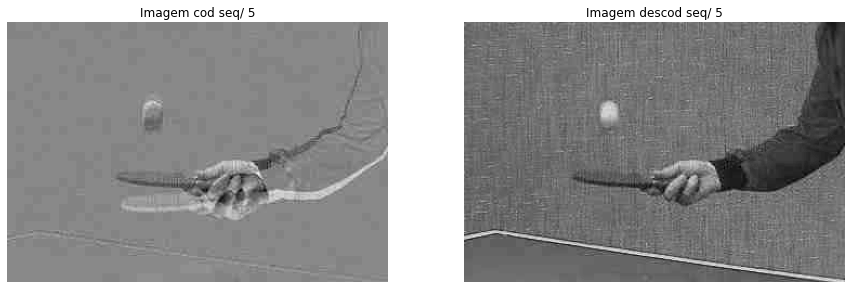

Taxa de compressão: 36.537326388888886
SNR: 20.371970327111452
Entropia:  2.2085564353737044
Energia:  96.06439


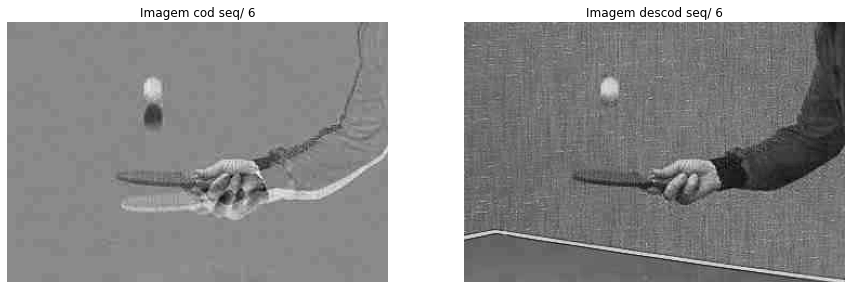

Taxa de compressão: 35.48126315789474
SNR: 20.247311874807234
Entropia:  2.3430230051926237
Energia:  97.410324


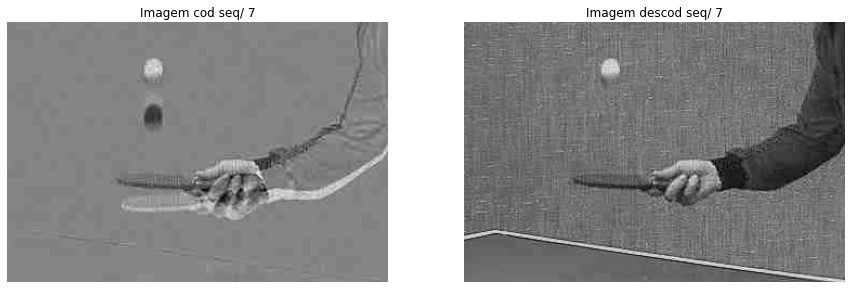

Taxa de compressão: 37.078345070422536
SNR: 20.272934580030363
Entropia:  2.1980494143329494
Energia:  92.535416


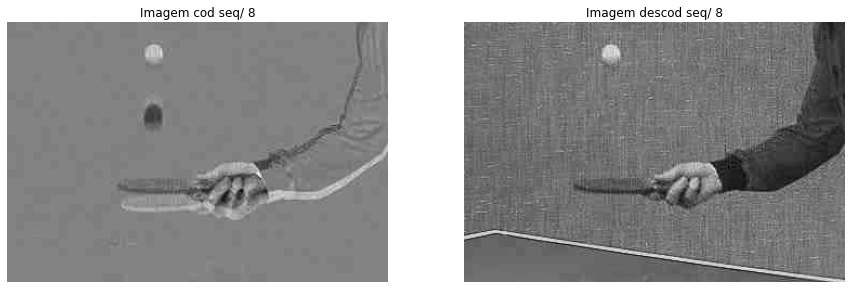

Taxa de compressão: 36.372735116479724
SNR: 20.24611109920572
Entropia:  2.2479292974770284
Energia:  83.64631


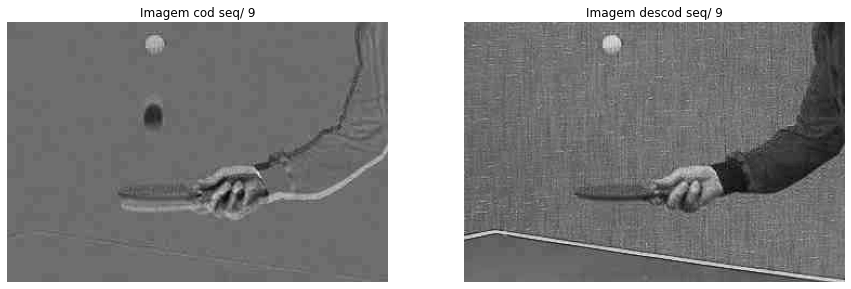

Taxa de compressão: 36.944736842105264
SNR: 20.213720970430504
Entropia:  2.1609042206949445
Energia:  63.98854


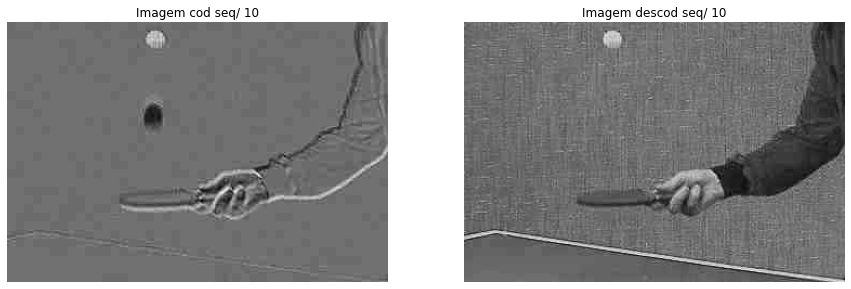

Taxa de compressão: 41.96011964107677
SNR: 20.341460606528685
Entropia:  1.7790894845176117
Energia:  34.18324


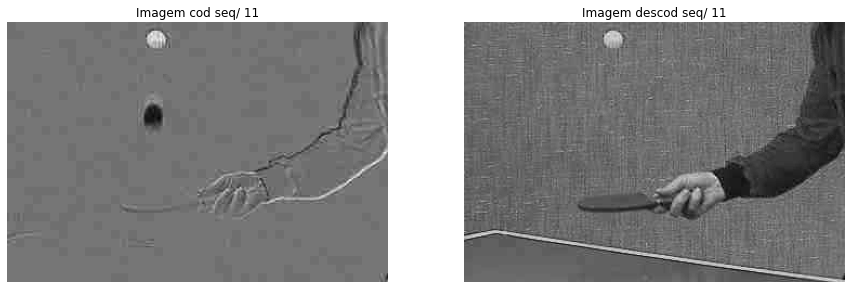

In [56]:
taxaCompBola_ex2,snr_bola_ex2,entropy_bola_ex2,energy_bola_ex2,time_codif_bola_ex2,time_decodif_bola_ex2 = resultados_ex2(framesBola,pathsBola)

Taxa de compressão: 9.156867779204108
SNR: 26.718652232601197
Entropia:  4.348031288813663
Energia:  260.04333


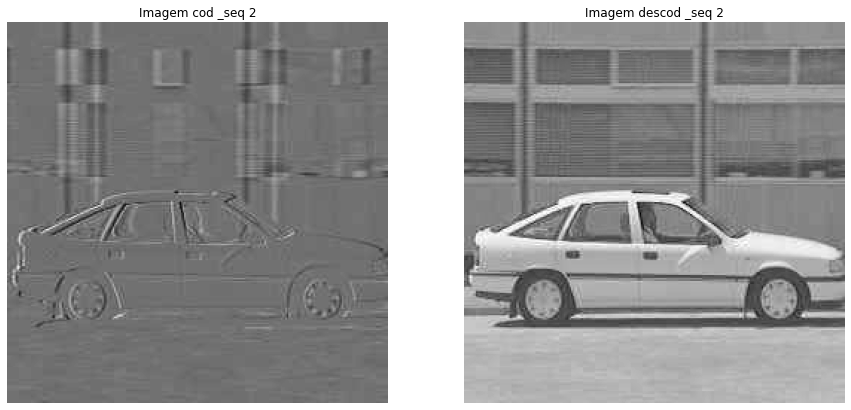

Taxa de compressão: 8.008386669609358
SNR: 26.322169405188113
Entropia:  4.772766936131845
Energia:  398.96204


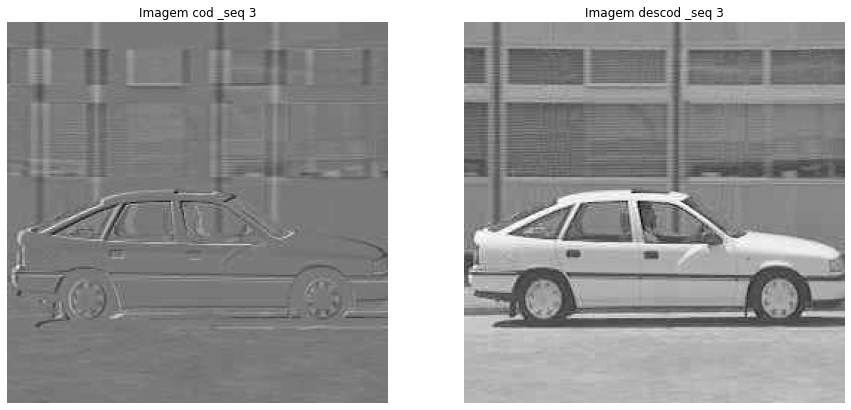

Taxa de compressão: 7.650852331074143
SNR: 26.427357415696562
Entropia:  4.98252726213253
Energia:  514.4424


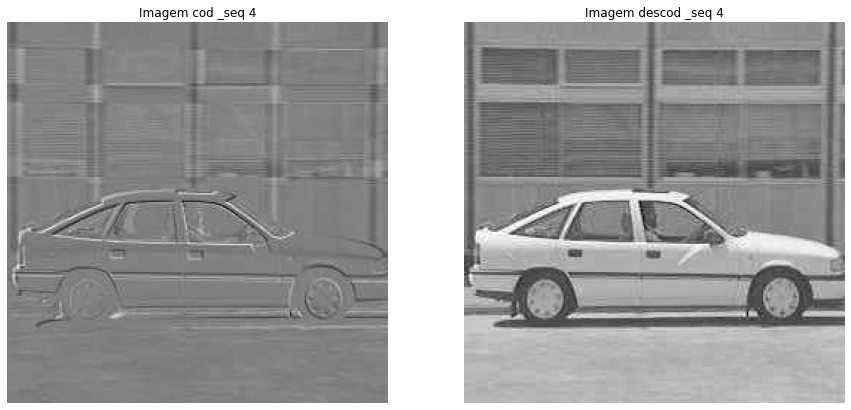

Taxa de compressão: 7.004225893200154
SNR: 26.221235818210914
Entropia:  5.171748158483705
Energia:  679.0055


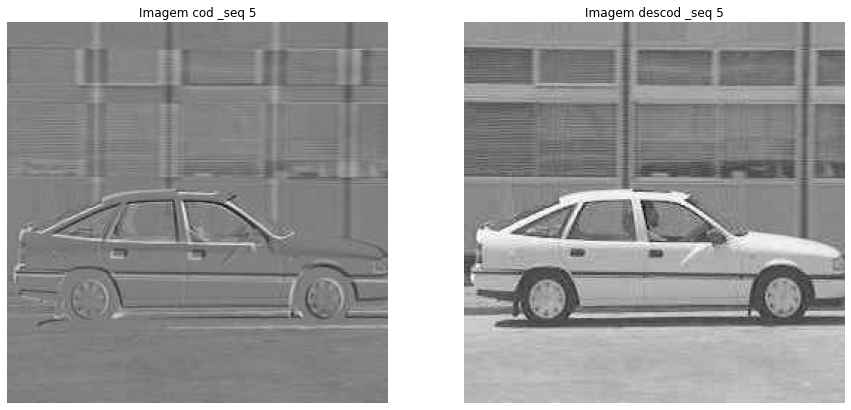

Taxa de compressão: 6.747333578521515
SNR: 26.153577219894693
Entropia:  5.366306778598194
Energia:  866.96265


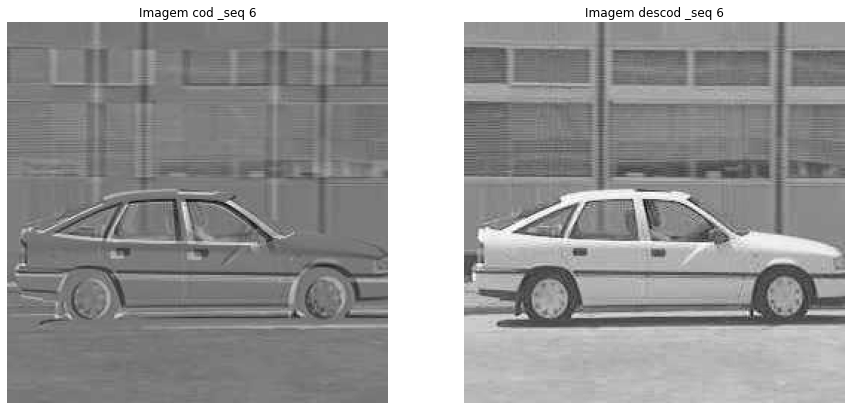

Taxa de compressão: 6.5760086455331415
SNR: 26.08664491030229
Entropia:  5.511805824750918
Energia:  1036.7963


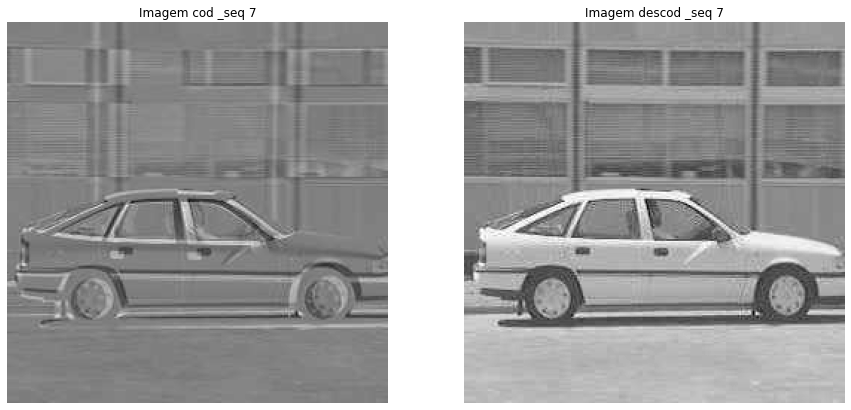

Taxa de compressão: 6.659244387661982
SNR: 26.16647493315091
Entropia:  5.545369436860735
Energia:  1124.747


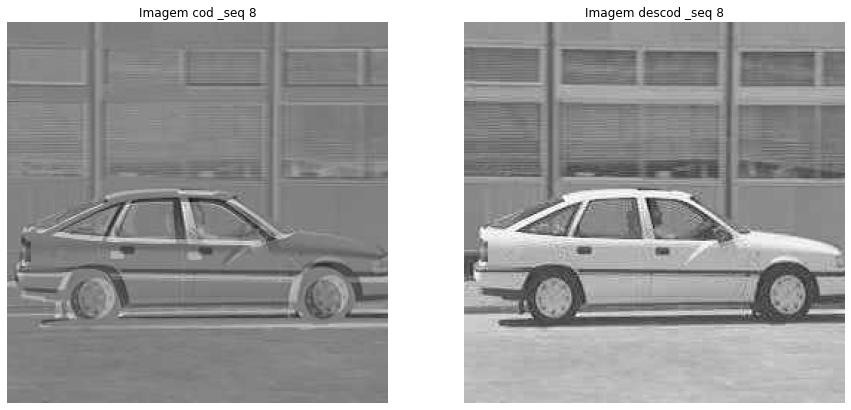

Taxa de compressão: 6.225409836065574
SNR: 25.93888081683163
Entropia:  5.705873899177828
Energia:  1269.0234


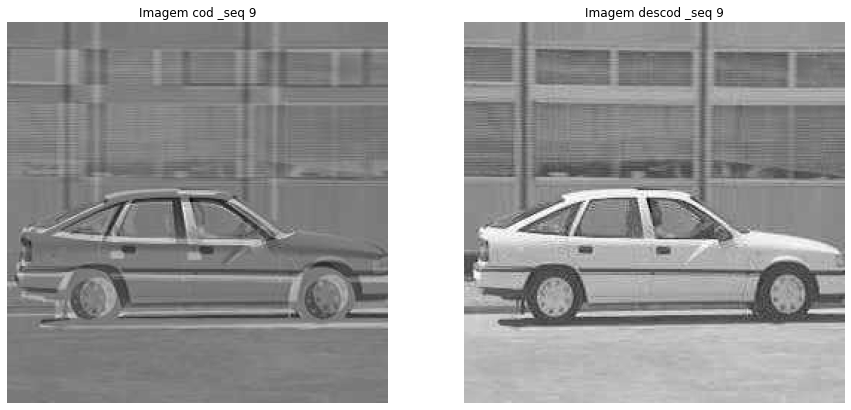

Taxa de compressão: 6.222035040431267
SNR: 25.910712445765064
Entropia:  5.768736067418459
Energia:  1375.1376


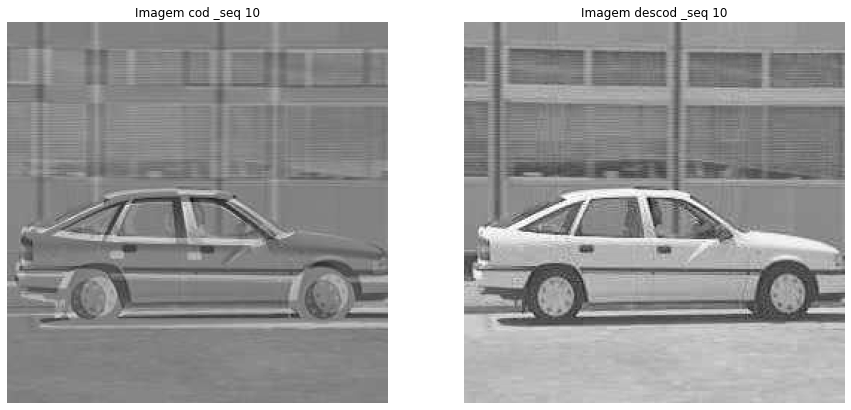

Taxa de compressão: 6.355900725983454
SNR: 26.006952827176022
Entropia:  5.821038254177846
Energia:  1451.1697


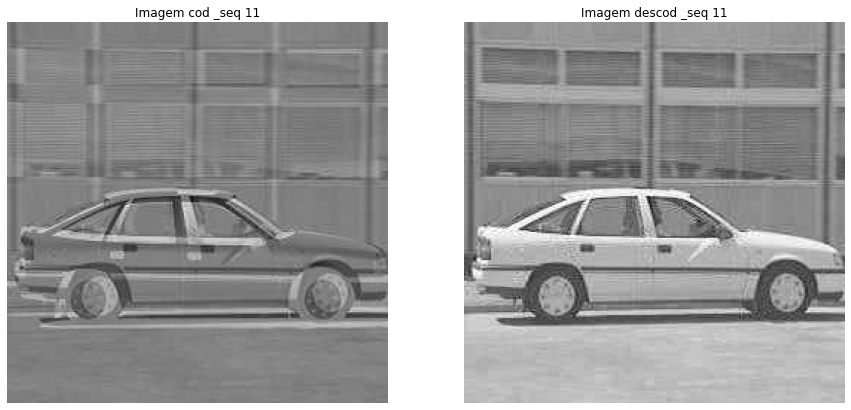

In [57]:
taxaCompCarro_ex2,snr_Carro_ex2,entropy_Carro_ex2,energy_Carro_ex2,time_codif_Carro_ex2,time_decodif_Carro_ex2 = resultados_ex2(framesCarro,pathsCarro)

### Taxa de Compressão

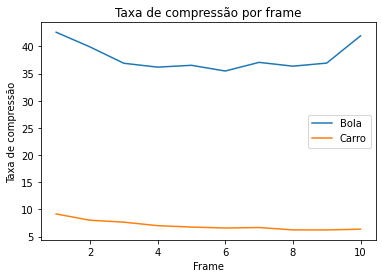

In [58]:
frames = range(1,len(taxaCompBola_ex2)+1)

plt.plot(frames,taxaCompBola_ex2,label='Bola')
plt.plot(frames,taxaCompCarro_ex2,label='Carro')
plt.xlabel('Frame')
plt.ylabel('Taxa de compressão')
plt.title('Taxa de compressão por frame')
plt.legend()
plt.show()

### SNR

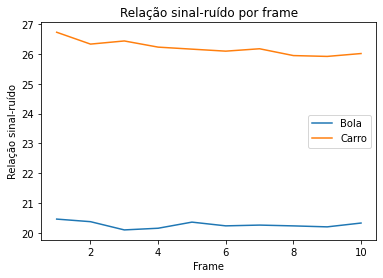

In [59]:
plt.plot(frames,snr_bola_ex2,label='Bola')
plt.plot(frames,snr_Carro_ex2,label='Carro')
plt.xlabel('Frame')
plt.ylabel('Relação sinal-ruído')
plt.title('Relação sinal-ruído por frame')
plt.legend()
plt.show()

### Entropia

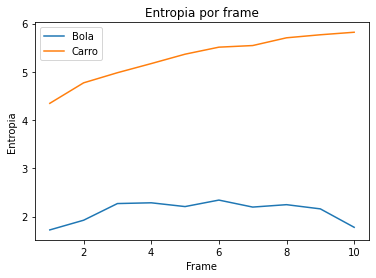

In [60]:
plt.plot(frames, entropy_bola_ex2, label='Bola')
plt.plot(frames, entropy_Carro_ex2, label='Carro')
plt.xlabel('Frame')
plt.ylabel('Entropia')
plt.title('Entropia por frame')
plt.legend()
plt.show()

### Energia Média por Pixel

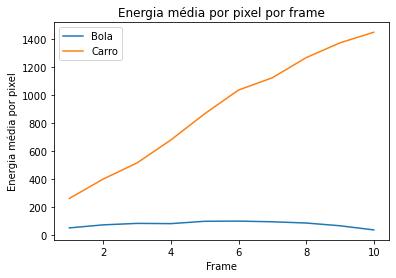

In [61]:
plt.plot(frames, energy_bola_ex2, label='Bola')
plt.plot(frames, energy_Carro_ex2, label='Carro')
plt.xlabel('Frame')
plt.ylabel('Energia média por pixel')
plt.title('Energia média por pixel por frame')
plt.legend()
plt.show()

### Tempo de Compressão e Descompressão

In [62]:
data = {'Frame': frames, 'Tempo de compressão (Bola)': time_codif_bola_ex2, 'Tempo de compressão (Carro)': time_codif_Carro_ex2,'Tempo de descompressão (Bola)': time_decodif_bola_ex2, 'Tempo de descompressão (Carro)': time_decodif_Carro_ex2}
df   = pd.DataFrame(data)
df

,Frame,Tempo de compressão (Bola),Tempo de compressão (Carro),Tempo de descompressão (Bola),Tempo de descompressão (Carro)
0,1,0.004062,0.004987,0.005344,0.004160
1,2,0.004542,0.003653,0.004241,0.003365
2,3,0.005460,0.004072,0.013330,0.004706
3,4,0.002154,0.010775,0.002504,0.006249
4,5,0.003860,0.004954,0.005227,0.004474
5,6,0.005280,0.005204,0.007036,0.006381
6,7,0.008513,0.008344,0.010971,0.011451
7,8,0.008953,0.005506,0.015247,0.002556
8,9,0.004790,0.004856,0.004447,0.005465
9,10,0.018662,0.006827,0.014643,0.011833


### Taxa de Compressão

In [63]:
data = {'Frame': frames, 'Taxa de compressão (Bola)': taxaCompBola_ex2, 'Taxa de compressão (Carro)': taxaCompCarro_ex2}
df   = pd.DataFrame(data)
df

,Frame,Taxa de compressão (Bola),Taxa de compressão (Carro)
0,1,42.623547,9.156868
1,2,39.920455,8.008387
2,3,36.912035,7.650852
3,4,36.195792,7.004226
4,5,36.537326,6.747334
5,6,35.481263,6.576009
6,7,37.078345,6.659244
7,8,36.372735,6.225410
8,9,36.944737,6.222035
9,10,41.960120,6.355901


## Análise dos Valores

Neste exercício foi realizado um <b>Codificador Interframe sem Compensação de Movimento</b>. Este tipo de codificação é responsável pela codificação espacial e temporal das frames do vídeo. Utiliza-se como frame de referencia a primeira I-Frame onde vai ser aplicada a compressão JPEG e efetuar a diferença com as P-Frames.

Para cada sequência de imagens foi calculada tambem a taxa de compressão, o SNR, a entropia, a energia e os tempos de compressão e descompressão, valores que podem ser observados em vários gráficos e tabelas.

## Taxa de Compressão

No inicio, realiza-se a compressão JPEG para a I-Frame com um fator de qualidade de 50%, sendo utilizada como frame de referência para as P-Frames. Neste tipo de codificação vai ser também realizado uma compressão temporal ao ter em conta não a frame no seu total como no primeiro caso, mas sim a diferença que existe entre as P-Frames e a I-Frame. Como tal, pode-se observar que a taxa de compressão, neste caso, vai ser superior à do caso anterior, visto que, para além da compressão JPEG, utiliza-se menos informação resultante da diferença entre frames.

## SNR

A relação sinal-ruído é uma medida responsável por comparar o nível de um sinal desejado com o nível de ruído de fundo. Esta relação está diretamente relacionada com a perda de informação que ocorre na compressão JPEG. Quanto maior o fator de qualidade, menor a perda logo maior o valor do SNR. Nesta codificação, para além do ruído proveniente da compressão JPEG pode-se obter ruído resultante da diferença entre frames.

## Entropia

Ao contrário do algoritmo anterior, neste não se obtem a frame total, mas sim uma diferença entre duas. Sendo a entropia a quantidade de informação existente na frame, ao se ter menos informação, visto que foi realizada a diferença, os valores de entropia vão ser menores. Isto verifica-se principalmente no caso dos frames da bola cujos valores da diferença entre frames levam a uma entropia baixa.

## Energia Média por Pixel

Como foi explicado no primeiro exercício deste trabalho a energia média por pixel representa a intensidade média dos valores de pixel e nas frames da sequência do carro há uma maior diferença entre valores pela maior complexidade em comparação com as frames da sequência da bola.

---

## Exercício 3
Considerar que todas as frames à exceção da primeira são inter-frames (P). Neste codificador deve implementar
a predição da frame a codificar com base na I-frame fazendo a compensação de movimento. A frame a transmitir
é a diferença entre a frame a codificar e a sua predição. Sugere-se a construção de três funções:

### 3.1.  
Uma função que realiza a medição do erro absoluto médio entre dois blocos (tamanho 16 × 16)

In [64]:
def mae(bloco1, bloco2):
    """
    Erro médio absoluto
    """
    
    dim = len(bloco1.ravel())
    sub = bloco1 - bloco2
    somatorio = np.sum(np.abs(sub).ravel())

    return somatorio/dim 

---

### 3.2. 
Uma função que realiza uma pesquisa (pode escolher a full-search ou outra) do macro-bloco da frame a codificar numa janela de pesquisa (-15 a +15) da I-frame

In [65]:
def limites(imagem, pixel_x, pixel_y):
    """
    Função que define os limites verticais e 
    horizontais da janela de pesquisa
    """
    
    janela_pesquisa = 15
    
    # Limites da imagem
    limite_horizontal = len(imagem)-1
    limite_vertical   = len(imagem[0])-1
    
    # Limites verticais da janela de procura
    lim_up     = max(0, pixel_x - 15)
    lim_bottom = min(pixel_x + 15 + janela_pesquisa, limite_horizontal) - 15
    
    # Limites horizontais da janela de procura
    lim_left  = max(0, pixel_y - 15) 
    lim_right = min(pixel_y + 15 + janela_pesquisa, limite_vertical) - 15
    
    return lim_up, lim_bottom, lim_left, lim_right

In [66]:
def full_search_block(iframe, pframe, posx, posy):
    """
    Função que obtém o melhor bloco e respetivo vetor de movimento
    """
    
    # a função limites obtém os limites da janela de pesquisa do bloco
    lim_up, lim_bottom, lim_left, lim_right = limites(iframe, posx, posy)
    bloco_pframe = pframe[posx:posx+16, posy:posy+16]
    
    erros        = []
    blocos       = []
    menor_mae    = 0
    melhor_bloco = []
    vetor        = (0,0)
    
    # para cada bloco da frame a codificar, é analisado o menor erro (MAE)
    # comparativamente à janela de pesquisa do mesmo bloco da IFrame
    for i in range(lim_up, lim_bottom + 1):
        for j in range(lim_left, lim_right + 1):
            bloco_iframe = iframe[i:i+16, j:j+16]
            erro = mae(bloco_pframe, bloco_iframe)
            if menor_mae == 0 or erro < menor_mae:
                vetor = (i - posx, j - posy)
                menor_mae = erro
                melhor_bloco = bloco_iframe
                
    return melhor_bloco, vetor

### 3.3.
Uma função que percorra os blocos da frame a codificar e construa a frame predita

In [67]:
def full_search_frame(i_frame, p_frame, path):
    """
    Função que obtém a predição da frame a codificar
    com base nos blocos obtidos pelo método full_search_block
    """
    
    n_linhas = int(i_frame.shape[0]/16)
    n_colunas = int(i_frame.shape[1]/16)
    
    predita = np.zeros((n_linhas * n_colunas, 16, 16))
    vetores = np.zeros((n_linhas * n_colunas, 2))
        
    count = 0
    for i in range(n_linhas):
        posx = i*16
        for j in range(n_colunas):
            posy = j*16
            bloco, vetor = full_search_block(i_frame, p_frame, posx, posy)
            predita[count] = bloco
            vetores[count] = vetor 
            count += 1
        
    l, c = i_frame.shape
    predita = remove_blocos16x16(predita, l, c)
    
    frame_transmitir = p_frame - predita
    frame_transmitir = (frame_transmitir + 255)/2.
    cv2.imwrite(path + '_cod3.jpg', frame_transmitir.astype('uint8'), (cv2.IMWRITE_JPEG_QUALITY,50))
    
    return predita, vetores

### Testes:

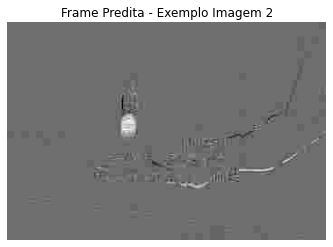

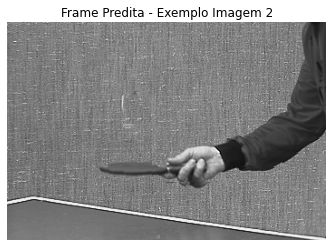

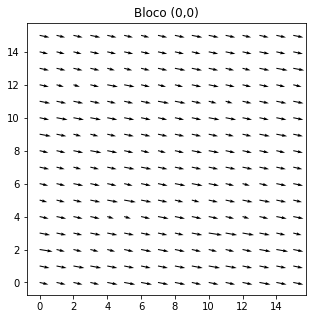

In [68]:
im1 = cv2.imread("bola_seq/bola_1.tiff", cv2.IMREAD_GRAYSCALE)
im2 = cv2.imread("bola_seq/bola_2.tiff", cv2.IMREAD_GRAYSCALE)

im1 = im1 * 1.
im2 = im2 * 1.

predita, vetores = full_search_frame(im1, im2, pathsBola[0])

imgst = cv2.imread("bola_seq/bola_1_cod3.jpg", cv2.IMREAD_GRAYSCALE)
plt.axis("off")
plt.title("Frame Predita - Exemplo Imagem 2")
plt.imshow(imgst)
plt.gray()
plt.show()


plt.axis("off")
plt.title("Frame Predita - Exemplo Imagem 2")
plt.imshow(predita)
plt.gray()
plt.show()


bestBlock, vetor = full_search_block(im1, im2, 0, 0)

fig, ax = plt.subplots(figsize = (5, 5))
ax.set_title('Bloco (0,0)')
plt.quiver(bestBlock, -14, 0) 
plt.show()

## Descodificação


In [69]:
def decodif_ex3(i_frame,vetores):

    #linhas e colunas dos blocos
    n_linhas = int(i_frame.shape[0]/16)
    n_colunas =int(i_frame.shape[1]/16)

    frame_predita = np.zeros((n_linhas*n_colunas,16,16))
    count = 0
    for i in range(n_linhas):
        posx = i*16
        for j in range(n_colunas):
            posy = j*16
            
            vetor = vetores[count]
            bloco = i_frame[int(posx+vetor[0]):int(posx+vetor[0])+16, int(posy+vetor[1]):int(posy+vetor[1])+16]

            frame_predita[count]=bloco
            count+=1
    
    linhas,colunas = i_frame.shape
    frame_predita = remove_blocos16x16(frame_predita,linhas,colunas)

    return frame_predita


In [70]:
def resultados_ex3(seq_imgs, seq_path):

    taxa_comp=[]
    snr_array=[]
    entropia=[]
    energia=[]
    time_codif=[]
    time_decodif=[]
    vetor = []
    i_frame = cv2.imread(seq_path[0] + '_cod1.jpg', cv2.IMREAD_GRAYSCALE)

    for i in range(len(seq_imgs)-1):

        frame = seq_imgs[i+1]
        path = seq_path[i+1]

        #Codificação

        t0 = time()
        frame_predita, vetores = full_search_frame(i_frame,frame,path)
        vetor.append(vetores)
        t1 = time()
        time_codif.append(t1-t0)

        #Descodificação

        frame_transmitir = cv2.imread(path + '_cod3.jpg',cv2.IMREAD_GRAYSCALE)
        predita = decodif_ex3(i_frame,vetores)


        frame_diff = ((frame_transmitir*2.)-255) # normalizar os valores
        frame_atual = predita+frame_diff
        imagem = np.clip(frame_atual,0,255)

        t2=time()
        time_decodif.append(t2-t1)

        #Taxa de compressão
        taxa_comp.append(comp_rate(path+'.tiff',path+'_cod3.jpg'))
        print("Taxa de Compressão: ",taxa_comp[i])

        #SNR
        snr_array.append(snr(frame,imagem))
        print("SNR: " ,snr_array[i])

        #Entropia
        entropia.append(entropy(frame_diff))
        print('Entropia: ',entropia[i])

        #Energia
        energia.append(energy(frame_diff))
        print('Energia: ',energia[i])

        plt.subplots(figsize=(15,15))
        plt.subplot(1,2,1)
        # plt.figure(figsize=(15,15))
        plt.axis('off')
        plt.title('Imagem predita - ' + str(i+2))
        plt.imshow(frame_predita)
        plt.gray()

        plt.subplot(1,2,2)
        # plt.figure(figsize=(15,15))
        plt.axis('off')
        plt.title('Imagem diferença - ' + str(i+2))
        plt.imshow(frame_diff)
        plt.gray()
        plt.show()

    return taxa_comp,snr_array,entropia,energia,time_codif,time_decodif

Taxa de Compressão:  48.091220068415055
SNR:  20.48157062258349
Entropia:  1.5377497447376176
Energia:  12.750757


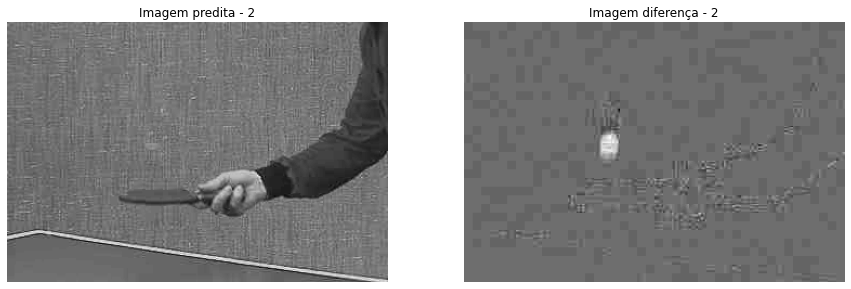

Taxa de Compressão:  47.85017026106697
SNR:  20.40984244469637
Entropia:  1.5751908588631025
Energia:  13.403219


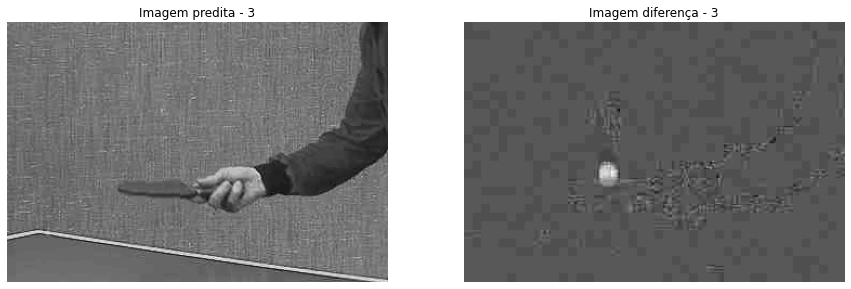

Taxa de Compressão:  44.34490010515247
SNR:  20.192425027637952
Entropia:  1.8707459660095946
Energia:  14.67339


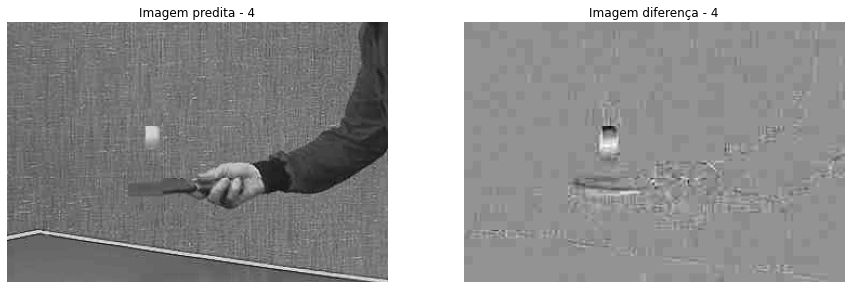

Taxa de Compressão:  44.159245678365636
SNR:  20.294743508487908
Entropia:  1.7983591202107143
Energia:  14.267613


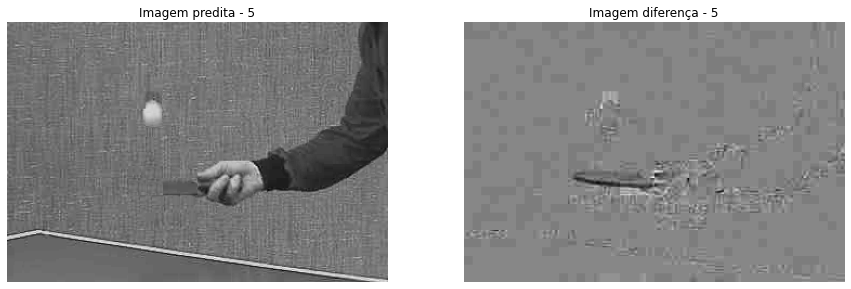

Taxa de Compressão:  43.50490956072351
SNR:  20.424533731173092
Entropia:  1.7874696878321195
Energia:  20.907387


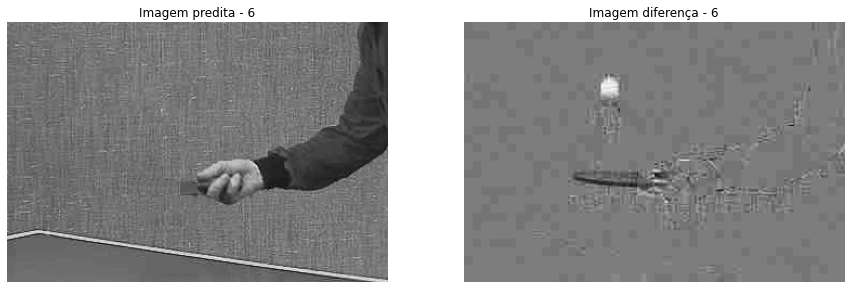

Taxa de Compressão:  43.504388229220446
SNR:  20.330681180468613
Entropia:  1.8692329567100836
Energia:  18.724527


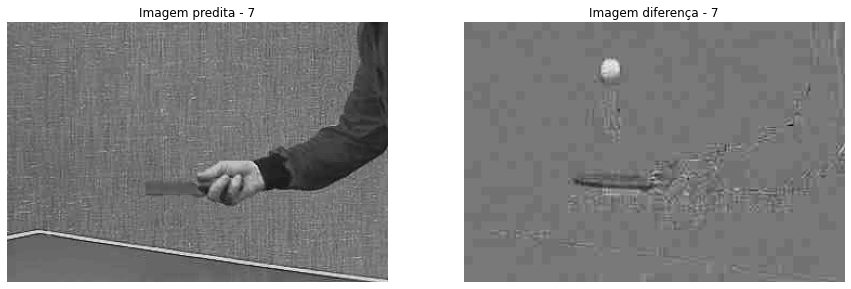

Taxa de Compressão:  45.340150699677075
SNR:  20.328224136225334
Entropia:  1.7073951090679578
Energia:  14.570455


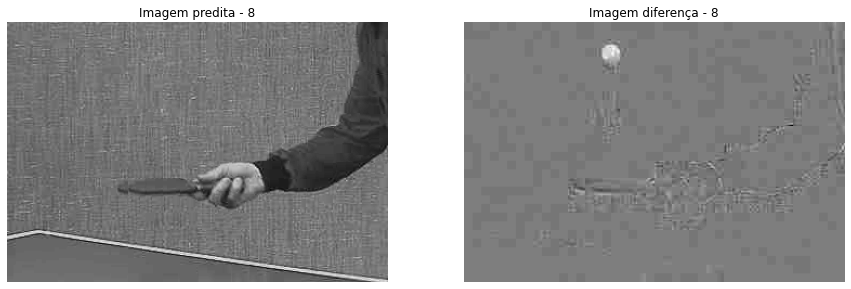

Taxa de Compressão:  45.821739130434786
SNR:  20.328674477579685
Entropia:  1.6982341668638923
Energia:  13.610795


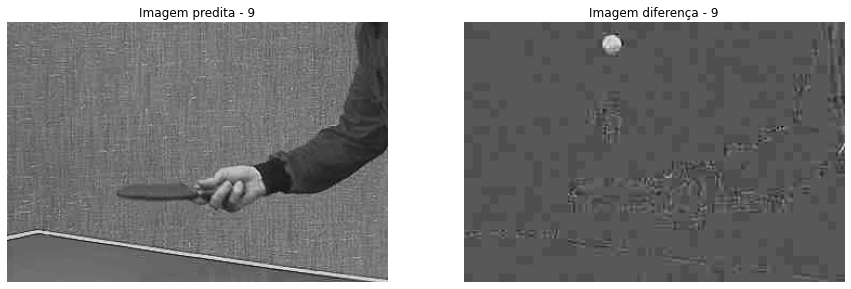

Taxa de Compressão:  45.26276195593767
SNR:  20.254709232851017
Entropia:  1.7194162572300462
Energia:  13.737026


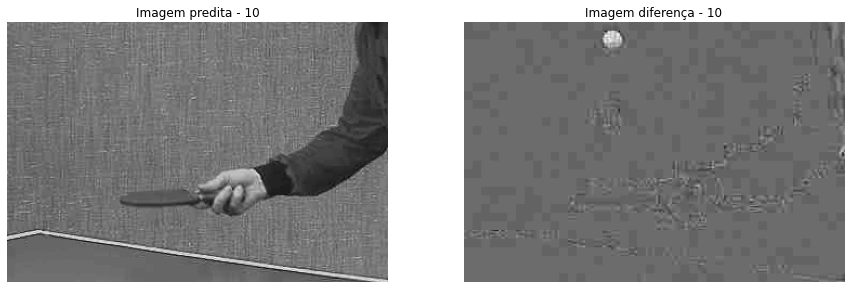

Taxa de Compressão:  47.85218874360432
SNR:  20.36089795566666
Entropia:  1.5025988539666173
Energia:  13.297443


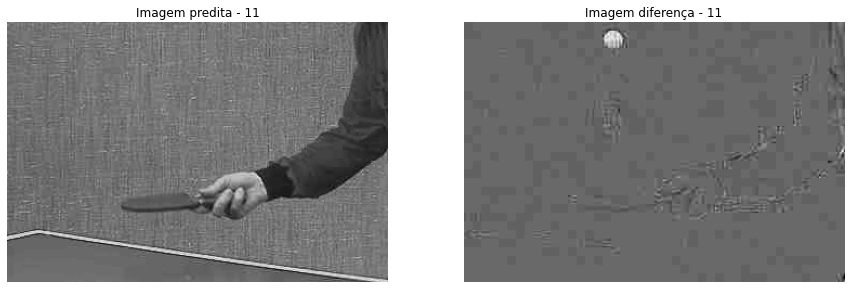

In [71]:
taxaCompBola_ex3,snr_bola_ex3,entropy_bola_ex3,energy_bola_ex3,time_codif_bola_ex3,time_decodif_bola_ex3 = resultados_ex3(framesBola,pathsBola)

Taxa de Compressão:  12.88046226074395
SNR:  27.693874345651842
Entropia:  3.398686517513833
Energia:  90.358154


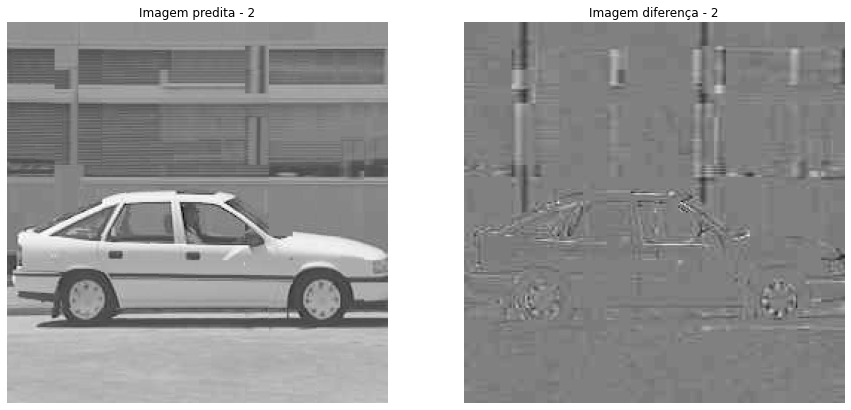

Taxa de Compressão:  11.19592718296822
SNR:  27.134158794848293
Entropia:  3.938004654743648
Energia:  126.47925


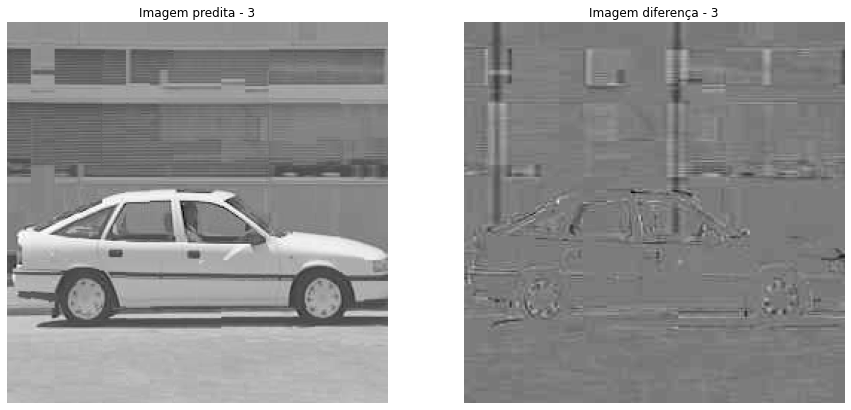

Taxa de Compressão:  11.357317073170732
SNR:  27.21012625939618
Entropia:  4.090027641936191
Energia:  134.66602


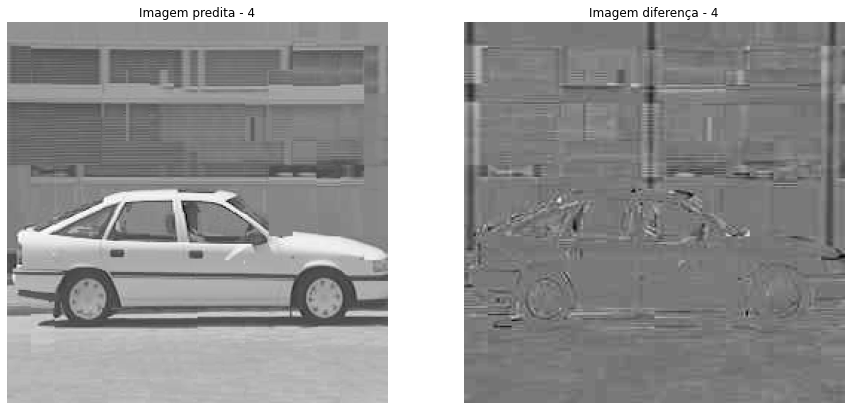

Taxa de Compressão:  10.109232048794011
SNR:  26.88078783928087
Entropia:  4.249148977811302
Energia:  162.5376


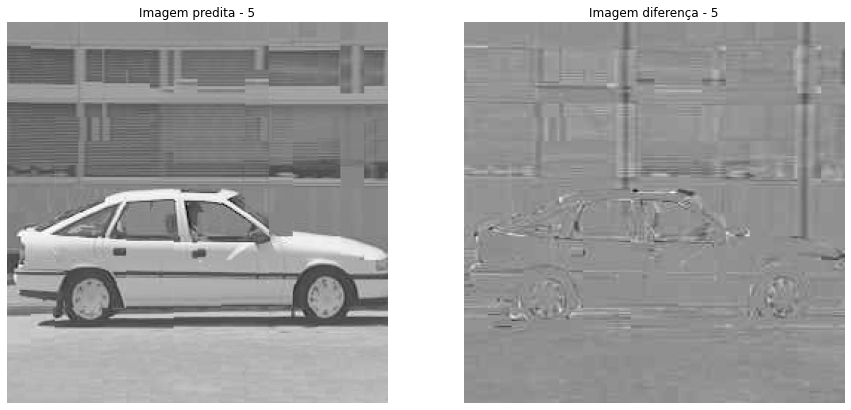

Taxa de Compressão:  9.986935220468155
SNR:  26.881555047943976
Entropia:  4.382116562008307
Energia:  188.32654


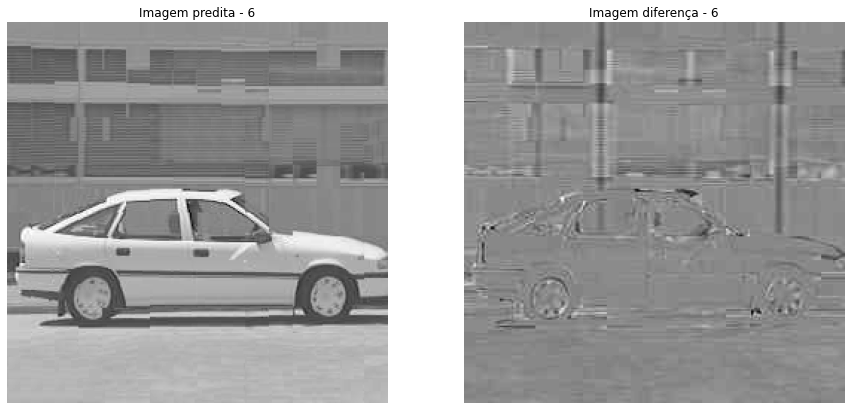

Taxa de Compressão:  9.96996176952485
SNR:  26.7988162947419
Entropia:  4.355561315603995
Energia:  196.2179


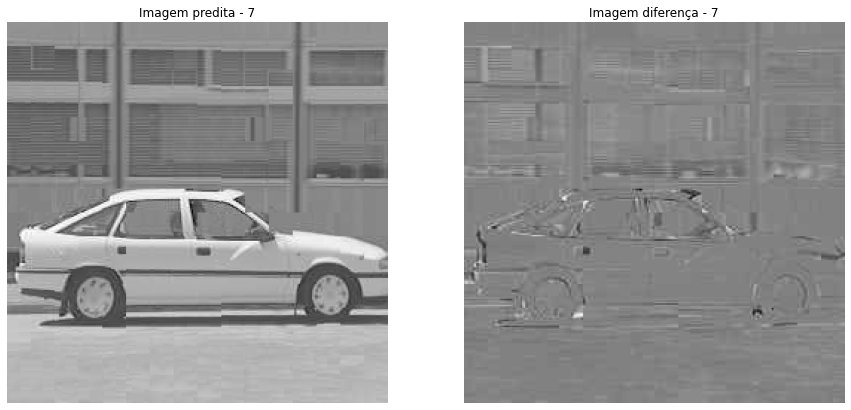

Taxa de Compressão:  9.698564593301436
SNR:  26.713606876894765
Entropia:  4.446469824721882
Energia:  204.32129


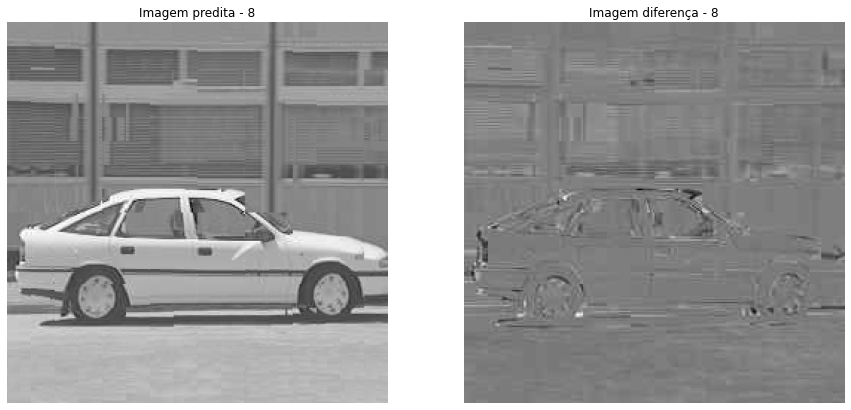

Taxa de Compressão:  9.224696356275304
SNR:  26.59447186678591
Entropia:  4.572898703312251
Energia:  245.46997


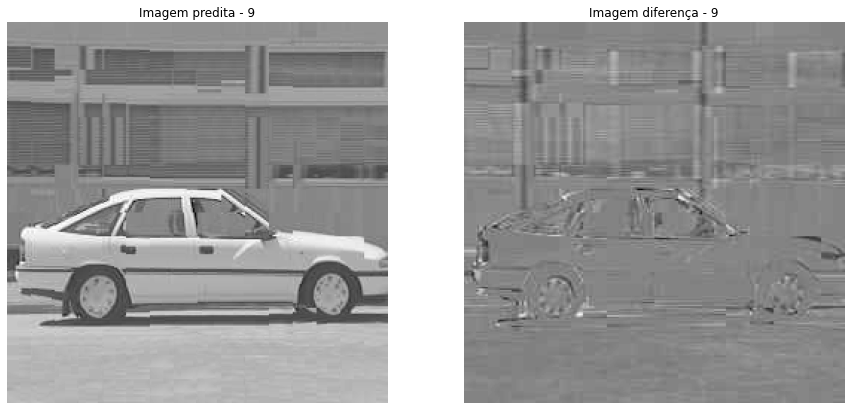

Taxa de Compressão:  9.2450563204005
SNR:  26.749984693941506
Entropia:  4.656015645425409
Energia:  267.1692


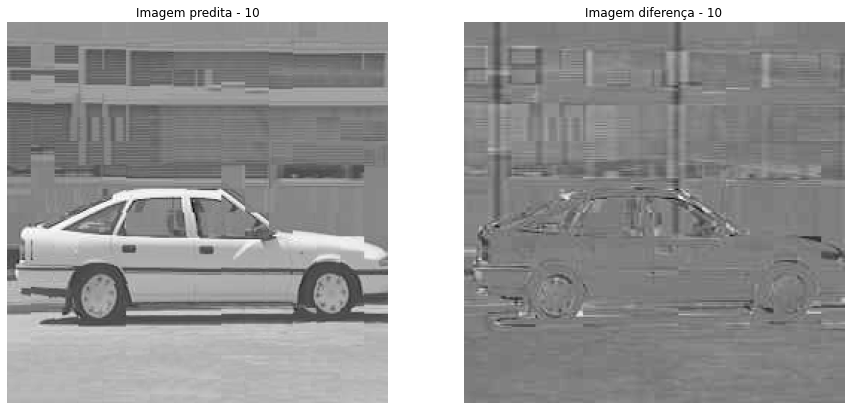

Taxa de Compressão:  9.130730050933787
SNR:  26.677894010027735
Entropia:  4.718920373028853
Energia:  281.25708


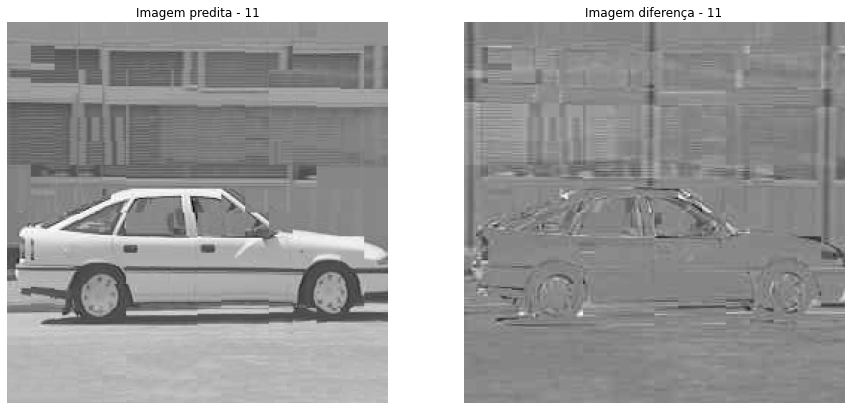

In [72]:
taxaCompCarro_ex3,snr_Carro_ex3,entropy_Carro_ex3,energy_Carro_ex3,time_codif_Carro_ex3,time_decodif_Carro_ex3 = resultados_ex3(framesCarro,pathsCarro)

## Taxa de Compressão

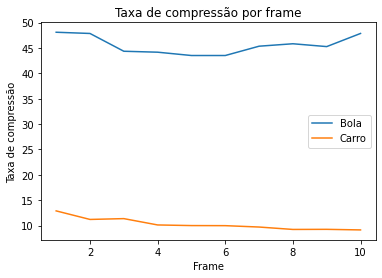

In [73]:
frames = range(1,len(taxaCompBola_ex3)+1)

plt.plot(frames,taxaCompBola_ex3,label='Bola')
plt.plot(frames,taxaCompCarro_ex3,label='Carro')
plt.xlabel('Frame')
plt.ylabel('Taxa de compressão')
plt.title('Taxa de compressão por frame')
plt.legend()
plt.show()

## SNR

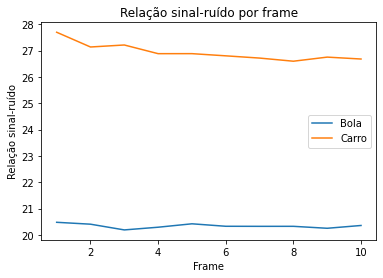

In [74]:
plt.plot(frames,snr_bola_ex3,label='Bola')
plt.plot(frames,snr_Carro_ex3,label='Carro')
plt.xlabel('Frame')
plt.ylabel('Relação sinal-ruído')
plt.title('Relação sinal-ruído por frame')
plt.legend()
plt.show()

## Entropia

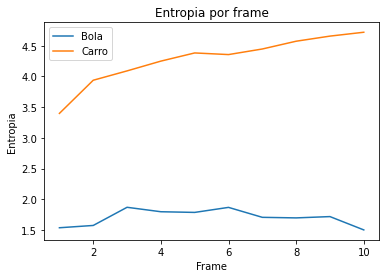

In [75]:
plt.plot(frames, entropy_bola_ex3, label='Bola')
plt.plot(frames, entropy_Carro_ex3, label='Carro')
plt.xlabel('Frame')
plt.ylabel('Entropia')
plt.title('Entropia por frame')
plt.legend()
plt.show()

## Energia Média por Pixel

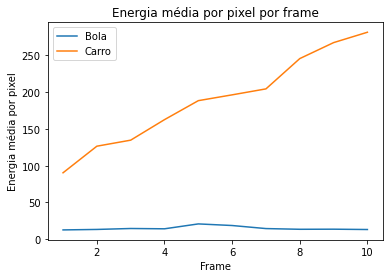

In [76]:
plt.plot(frames, energy_bola_ex3, label='Bola')
plt.plot(frames, energy_Carro_ex3, label='Carro')
plt.xlabel('Frame')
plt.ylabel('Energia média por pixel')
plt.title('Energia média por pixel por frame')
plt.legend()
plt.show()

## Tempo de Compressão e Descompressão

In [77]:
data = {'Frame': frames, 'Tempo de compressão (Bola)': time_codif_bola_ex3, 'Tempo de compressão (Carro)': time_codif_Carro_ex3,'Tempo de descompressão (Bola)': time_decodif_bola_ex3, 'Tempo de descompressão (Carro)': time_decodif_Carro_ex3}
df = pd.DataFrame(data)
df

,Frame,Tempo de compressão (Bola),Tempo de compressão (Carro),Tempo de descompressão (Bola),Tempo de descompressão (Carro)
0,1,6.601566,5.164821,0.006892,0.007188
1,2,6.550038,5.206083,0.007477,0.004605
2,3,6.767709,5.274455,0.005378,0.004019
3,4,6.240151,5.217033,0.005643,0.004894
4,5,6.055582,4.448621,0.020592,0.007076
5,6,5.556669,5.043521,0.008961,0.003727
6,7,5.911816,4.687899,0.005558,0.005477
7,8,6.777384,4.896367,0.001446,0.004634
8,9,6.003258,4.713055,0.004794,0.005812
9,10,6.317078,4.947847,0.008812,0.005929


## Taxa de Compressão

In [78]:
data = {'Frame': frames, 'Taxa de compressão (Bola)': taxaCompBola_ex3, 'Taxa de compressão (Carro)': taxaCompCarro_ex3}
df = pd.DataFrame(data)
df

,Frame,Taxa de compressão (Bola),Taxa de compressão (Carro)
0,1,48.091220,12.880462
1,2,47.850170,11.195927
2,3,44.344900,11.357317
3,4,44.159246,10.109232
4,5,43.504910,9.986935
5,6,43.504388,9.969962
6,7,45.340151,9.698565
7,8,45.821739,9.224696
8,9,45.262762,9.245056
9,10,47.852189,9.130730


## Análise dos Valores

Neste exercício foi realizado um <b> Codificador Interframe Com Compensação de Movimento</b>. Este tipo de codificação é responsável pela codificação espacial e temporal das frames de vídeo ao ser considerado a primeira frame como uma I-Frame onde é aplicada uma compressão JPEG e, tendo esta referência, compará-la com as P-Frames e encontrar o bloco desta mesma que melhor se assemelha ao bloco da frame atual.

Para cada sequência de imagens (bola e carro) foi também calculada a taxa de compressão, o SNR, a entropia e os tempos de codificação e descodificação, valores que podem ser vistos em gráficos e tabelas diversas.

## Taxa de Compressão

Tal como no outro caso de codificação interframe, inicialmente tem-se a compressão JPERG espacial da I-Frame, com um fator de qualidade de 50%, que vai servir como frame de referência para as P-Frames. Neste tipo de codificação vai-se realizar também a compressão temporal na comparação entre a I-frame e as P-Frames. Desta comparação vão resultar vetores de movimento que indicam para a frame estimada onde se encontra na I-frame o melhor bloco.

Como se pode verificar, para o caso das bolas, vai-se ter uma grande diferença entre este algoritmo e o primeiro, visto que neste tem-se uma alta taxa de compressão por volta das 40 unidades enquanto que nas frames do carro os valores estão por volta das 13 unidades. isto deve-se ao fato desta mesma reutilização tendo-se simplesmente em conta os vetores de movimento e a I-Frame.

## SNR

A relação sinal-ruído é uma medida responsável por comparar o nível de um sinal desejado com o nível de ruído de fundo. Esta está diretamente relacionada com a perda de informação que ocorre na compressão JPEG Quanto maior o fator de qualidade, menor a perda logo maior o valor do SNR. Tal como no caso anterior, nesta codificação, para além do ruído proveniente da compressão JPEG, pode-se obter ruído resultante da diferença entre frames. Enquanto que para o caso da bola obtem-se um SNR perto dos 20dbs, no caso do carro já se encontra perto dos 30.

## Entropia

A entropia obtida para este último caso apresenta valores semelhantes aos anteriores uma vez que é feita a diferença entre a frame a codificar e a sua predição. Como tal, tem-se também menos informação do que no primeiro caso, o que faz decrescer o valor da entropia.

## Energia Média por Píxel

Neste ultimo exercicio observa-se o mesmo fenómeno do exercício 2 onde as frames da sequência do carro tem uma maior diferença de valores enquanto que nas frames da sequência da bola são valores mais lineares.

Estes valores são mais pequenos quando se compara com os valores do exercício 2 pela reutilização das frames, uma redução do uso das frames temporais e por ser uma compressão mais eficiente fazendo com que estes valores diminuam significamente em comparação aos do exercicio 2 na sequência do carro